# Analysis Ibague's Trees

## DS4A-Colombia
Team 123 

Members:

    1. Eduard Molano
    2. Leonardo Pérez
    3. Daniel Ruiz
    4. Luisa de la Hortúa
    5. Stiven Cabrera
    6. Juan Bautista
    
For this project we need to do a series of EDA for our trees data and a model that would help the better understanding of the problem. So the notebook is divided in three main points the data cleaning, the EDA and the model. 

## Libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import random
import geopandas as gpd
import folium
import pyproj
import plotly.express as px
import plotly.graph_objects as go
from pyproj.crs import CRS
from fiona.crs import from_epsg
import warnings
warnings.filterwarnings("ignore")
from imblearn.over_sampling import SMOTE 

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import sklearn.metrics as metrics
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, f1_score
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold 
from sklearn.model_selection import cross_val_score 
from sklearn.model_selection import cross_val_predict 

sns.set_theme()
pd.set_option('display.max_columns', None)

## Dataset

In [2]:
df = pd.read_csv('Datos_Ibague.csv', sep=';', encoding='latin1')
df.head()

,OBJECTID,OBJECTID_1,Codigo_Uni,fecha,municipio,comuna,zona,subzona,cod_censista,num_arbol,familia,nom_cientifico,nom_comun,procedencia,UICN,habito_creciemiento,emplazamiento,altura_fuste,altura_total,diametro_copa,diametro_normal,volumen_m3,inc,rd,dm,bbs,abs,estado_fisico,pi,ph,pa,pd,pe,pp,po,estado_sanitario,densidad_follaje,valor_estetico,cre,crh,cra,coa,ce,civ,crt,crg,cap,r_vol,r_cr,r_ce,fotografia,fase,GlobalID,X,Y,Barrio
0,98717,56585,67352 - F3,16/05/2017,Ibague,7,4,4,Cuadrilla_12,67352,Myrtaceae,Syzygium_malaccense,Pera_de_malaca,Exotica,LC,Arbol,Zona_blanda,3,"5,2",2,"18,3","0,523170648",0,0,0,0,0,Malo,20,0,0,80,0,0,0,Muerto,Ralo,Inaceptable,No,No,No,No,No,No,No,No,No,0,0,0,C:\Users\juan-arias.CORTOLI1\Documents\ArcGIS\...,F3,{DF618195-9BA3-42B8-B900-153874CA5FD7},"883744,684","984472,5618",Otro
1,99083,61808,65768 - F3,16/05/2017,Ibague,7,4,4,Cuadrilla_10,65768,Fabaceae,Pithecellobium_dulce,Payande,Nativa,LC,Arbol,Zona_blanda,"0,5","4,9","2,5","17,7","0,476824194",0,0,20,40,20,Regular,0,0,0,20,0,0,0,Sano,Denso,Deseable,No,No,No,Si,No,No,No,No,No,0,0,0,C:\Users\juan-arias.CORTOLI1\Documents\ArcGIS\...,F3,{F03C72BE-7978-4F7C-B2D3-A6525632AE19},"883742,6131","984515,2839",Otro
2,98669,66706,65769 - F3,16/05/2017,Ibague,7,4,4,Cuadrilla_10,65769,Combretaceae,Terminalia_catappa,Almendro,Exotica,NE,Arbol,Zona_blanda,"3,5","5,5",5,27,"0,8164233",0,20,0,0,0,Bueno,0,0,0,20,0,0,0,Sano,Denso,Deseable,No,No,No,Si,No,Si,No,No,No,20,20,0,C:\Users\juan-arias.CORTOLI1\Documents\ArcGIS\...,F3,{0ADD2CC1-1E82-4EC2-B98D-7DD8016B71D3},"883741,3773","984466,8292",Otro
3,99327,59629,65767 - F3,16/05/2017,Ibague,7,4,4,Cuadrilla_10,65767,Fabaceae,Pithecellobium_dulce,Payande,Nativa,LC,Arbol,Zona_blanda,"0,6","3,8",3,"11,6","0,242343024",20,0,20,0,20,Regular,20,0,0,0,0,0,0,Sano,Denso,Deseable,No,No,No,Si,No,No,No,No,No,0,0,0,C:\Users\juan-arias.CORTOLI1\Documents\ArcGIS\...,F3,{03AAD258-1A06-4A17-8EB0-A7E5AA323338},"883741,158","984540,5588",Otro
4,98884,64850,66071 - F3,16/05/2017,Ibague,7,4,4,Cuadrilla_11,66071,Myrtaceae,Psidium_guajava,Guayabo,Nativa,NE,Arbol,Zona_blanda,"3,6","7,5",5,21,"0,8659035",20,0,0,0,0,Bueno,0,0,0,0,0,0,0,Sano,Denso,Deseable,No,No,No,Si,No,No,No,No,No,0,0,0,C:\Users\juan-arias.CORTOLI1\Documents\ArcGIS\...,F3,{A942F3CE-2719-416E-9F46-F3A03E97BD97},"883741,0111","984493,2908",Otro


In [3]:
df.shape

(101285, 56)

In [4]:
df.columns

Index(['OBJECTID', 'OBJECTID_1', 'Codigo_Uni', 'fecha', 'municipio', 'comuna',
       'zona', 'subzona', 'cod_censista', 'num_arbol', 'familia',
       'nom_cientifico', 'nom_comun', 'procedencia', 'UICN',
       'habito_creciemiento', 'emplazamiento', 'altura_fuste ', 'altura_total',
       'diametro_copa', 'diametro_normal', 'volumen_m3', 'inc', 'rd', 'dm',
       'bbs', 'abs', 'estado_fisico', 'pi', 'ph', 'pa', 'pd', 'pe', 'pp', 'po',
       'estado_sanitario ', 'densidad_follaje', 'valor_estetico', 'cre', 'crh',
       'cra', 'coa', 'ce', 'civ', 'crt', 'crg', 'cap', 'r_vol', 'r_cr', 'r_ce',
       'fotografia', 'fase', 'GlobalID', 'X', 'Y', 'Barrio'],
      dtype='object')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101285 entries, 0 to 101284
Data columns (total 56 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   OBJECTID             101285 non-null  int64 
 1   OBJECTID_1           101285 non-null  int64 
 2   Codigo_Uni           101285 non-null  object
 3   fecha                101285 non-null  object
 4   municipio            101285 non-null  object
 5   comuna               101285 non-null  int64 
 6   zona                 101285 non-null  object
 7   subzona              101285 non-null  object
 8   cod_censista         101285 non-null  object
 9   num_arbol            101285 non-null  object
 10  familia              101285 non-null  object
 11  nom_cientifico       101285 non-null  object
 12  nom_comun            101285 non-null  object
 13  procedencia          101285 non-null  object
 14  UICN                 101285 non-null  object
 15  habito_creciemiento  101285 non-nu

## Data Cleaning

### Modifying data types per column

#### Date

In [6]:
df['fecha'] = pd.to_datetime(df.fecha)
df.fecha.head()

0   2017-05-16
1   2017-05-16
2   2017-05-16
3   2017-05-16
4   2017-05-16
Name: fecha, dtype: datetime64[ns]

#### nom_cientifico

In [7]:
def sort_unique(column_name):
    return df[column_name].sort_values().unique()

In [8]:
sort_unique('nom_cientifico')

array(['Abarema_jupunba', 'Acacia_baileyana', 'Acacia_farnesiana',
       'Acacia_mangium', 'Acacia_sp', 'Acalypha_diversifolia',
       'Acalypha_hispida', 'Acalypha_macrostachya', 'Acalypha_wilkesiana',
       'Acca_sellowiana', 'Adenanthera_pavonina', 'Adenaria_floribunda',
       'Adonidia_merrillii', 'Aegiphila_panamensis', 'Afrocarpus_sp',
       'Aiphanes_horrida', 'Albizia_carbonaria', 'Albizia_guachapele',
       'Allamanda_blanchetii', 'Allamanda_cathartica',
       'Alstonia_scholaris', 'Alternanthera_brasiliana',
       'Amyris_balsamifera', 'Anacardium_excelsum',
       'Anacardium_occidentale', 'Andira_inermis', 'Annona_cherimola',
       'Annona_muricata', 'Annona_squamosa', 'Anredera_cordifolia',
       'Aphelandra_sp', 'Araucaria?ácolumnaris', 'Archontophoenix_sp',
       'Ardisia_revoluta', 'Areca_catechu', 'Artocarpus_altilis',
       'Artocarpus_heterophyllus', 'Attalea_butyraceae',
       'Averrhoa_carambola', 'Azadirachta_indica', 'Bactris_gasipaes',
       'Bambu

In [9]:
df[df.nom_cientifico == 'Araucaria?�columnaris'].head()

,OBJECTID,OBJECTID_1,Codigo_Uni,fecha,municipio,comuna,zona,subzona,cod_censista,num_arbol,familia,nom_cientifico,nom_comun,procedencia,UICN,habito_creciemiento,emplazamiento,altura_fuste,altura_total,diametro_copa,diametro_normal,volumen_m3,inc,rd,dm,bbs,abs,estado_fisico,pi,ph,pa,pd,pe,pp,po,estado_sanitario,densidad_follaje,valor_estetico,cre,crh,cra,coa,ce,civ,crt,crg,cap,r_vol,r_cr,r_ce,fotografia,fase,GlobalID,X,Y,Barrio


In [10]:
sci_names = list(sort_unique('nom_cientifico'))

In [11]:
def splitting_sci_names(name):
    if '?�' in name:
        return str(name).split('?�')
    return str(name).split('_')

In [12]:
def fixing_sci_names(name):
    if '?�' in name:
        return str(name).replace('?�', '_')
    return name

df['nom_cientifico'] = df.nom_cientifico.apply(fixing_sci_names)
df['nom_cientifico'] = df.nom_cientifico.astype('category')

#### familia

In [13]:
sort_unique('familia')

array(['Acanthaceae', 'Adoxaceae', 'Amaranthaceae', 'Anacardiaceae',
       'Annonaceae', 'Apocynaceae', 'Araliaceae', 'Araucariaceae',
       'Arecaceae', 'Asparagaceae', 'Asteraceae', 'Basellaceae',
       'Bignoniaceae', 'Bixaceae', 'Boraginaceae', 'Burseraceae',
       'Cactaceae', 'Calophyllaceae', 'Cannabaceae', 'Capparidaceae',
       'Caricaceae', 'Casuarinaceae', 'Chrysobalanaceae', 'Clusiaceae',
       'Combretaceae', 'Compositae', 'Cupressaceae', 'Cycadaceae',
       'Erythroxylaceae', 'Estrelitziaceae', 'Euphorbiaceae', 'Fabaceae',
       'Hernandiaceae', 'Hipericaceae', 'Juglandaceae', 'Lacistemataceae',
       'Lamiaceae', 'Lauraceae', 'Lecythidaceae', 'Leguminosae',
       'Lythraceae', 'Magnoliaceae', 'Malpighiaceae', 'Malvaceae',
       'Melastomataceae', 'Meliaceae', 'Meliaceae ', 'Moraceae',
       'Moringaceae', 'Muntingiaceae', 'Myrtaceae', 'Nyctaginaceae',
       'Ocnaceae', 'Oleaceae', 'Oxalidaceae', 'Pandanaceae',
       'Passifloraceae', 'Phyllanthaceae', 'Pina

We can see **'Meliaceae'** is twice on familia column, but one has an blank space at the end of the word, so this need to be stripped (method) to have only one value.

In [14]:
df['familia'] = df.familia.str.strip()

In [15]:
sort_unique('familia')

array(['Acanthaceae', 'Adoxaceae', 'Amaranthaceae', 'Anacardiaceae',
       'Annonaceae', 'Apocynaceae', 'Araliaceae', 'Araucariaceae',
       'Arecaceae', 'Asparagaceae', 'Asteraceae', 'Basellaceae',
       'Bignoniaceae', 'Bixaceae', 'Boraginaceae', 'Burseraceae',
       'Cactaceae', 'Calophyllaceae', 'Cannabaceae', 'Capparidaceae',
       'Caricaceae', 'Casuarinaceae', 'Chrysobalanaceae', 'Clusiaceae',
       'Combretaceae', 'Compositae', 'Cupressaceae', 'Cycadaceae',
       'Erythroxylaceae', 'Estrelitziaceae', 'Euphorbiaceae', 'Fabaceae',
       'Hernandiaceae', 'Hipericaceae', 'Juglandaceae', 'Lacistemataceae',
       'Lamiaceae', 'Lauraceae', 'Lecythidaceae', 'Leguminosae',
       'Lythraceae', 'Magnoliaceae', 'Malpighiaceae', 'Malvaceae',
       'Melastomataceae', 'Meliaceae', 'Moraceae', 'Moringaceae',
       'Muntingiaceae', 'Myrtaceae', 'Nyctaginaceae', 'Ocnaceae',
       'Oleaceae', 'Oxalidaceae', 'Pandanaceae', 'Passifloraceae',
       'Phyllanthaceae', 'Pinaceae', 'Pipera

In [16]:
df['familia'] = df.familia.astype('category')

#### nom_comun

In [17]:
sort_unique('nom_comun')

array(['Acacia_ferruginea', 'Acacia_forrajera', 'Acacia_mangium',
       'Acacia_morada', 'Acacia_sp', 'Acacio_amarillo', 'Acacio_rojo',
       'Aceite_maria', 'Aceituno', 'Acerola', 'Achiote', 'Aegihila',
       'Afelandra', 'Afrocarpus_sp', 'Aguacate', 'Aguacatillo',
       'Alcanforero', 'Alcaparro', 'Algarrobo', 'Algodon_arboreo',
       'Algodonero', 'Alma_negra', 'Almancayo', 'Almendro', 'Amargo',
       'Amarrabollo', 'Ame', 'Amor_al_dia', 'Anon', 'Anon_silvestre',
       'Aphelandra', 'Arabia_fragante', 'Araucaria', 'Araza',
       'Arbol_de_la_felicidad', 'Arbol_del_pan', 'Arbol_del_viajero',
       'Archo', 'Ardisia', 'Aromito', 'Arrayan', 'Arrayan_dulce',
       'Azahar_de_noche', 'Azuceno', 'Azulina', 'Balso', 'Bambu_dorado',
       'Banco_volador', 'Bayo', 'Bencenuco', 'Biyuyo', 'Bledo',
       'Borrachero_blanco', 'Brevo', 'Brunfelsia', 'Buchegallina',
       'Buque_de_coste?äo', 'Cacao', 'Cacao_de_monte', 'Cachafruto',
       'Cachimbo', 'Cafe', 'Caimaron', 'Caimito', 'C

In [18]:
df['nom_comun'] = df.nom_comun.astype('category')

#### procedencia

In [19]:
sort_unique('procedencia')

array(['Exotica', 'Nativa'], dtype=object)

In [20]:
df['procedencia'] = df.procedencia.astype('category')

#### UICN

In [21]:
sort_unique('UICN')

array(['CR', 'EN', 'EW', 'LC', 'NE', 'NT', 'VU'], dtype=object)

We're going to replace these values for the significance of each one in order to better understand the information. Probably, these values will be changed into their originals again.

In [22]:
dicc_UICN = {
    'CR':'En_peligro_critico',
    'EN':'En_peligro_vulnerable',
    'EW':'Extinto_en_estado_silvestre',
    'LC':'Preocupacion_menor',
    'NE':'No_evaluado',
    'NT':'Casi_amenazado',
    'VU':'Vulnerable'
}

df['UICN'] = df['UICN'].replace(to_replace=dicc_UICN)
df['UICN'] = df['UICN'].astype('category')

#### habito_crecimiento

In [23]:
df.rename(columns={'habito_creciemiento':'habito_crecimiento'}, inplace=True)
sort_unique('habito_crecimiento')

array(['Arbol', 'Arbusto', 'Bambu', 'Palma'], dtype=object)

In [24]:
df['habito_crecimiento'] = df.habito_crecimiento.astype('category')

#### emplazamiento

In [25]:
sort_unique('emplazamiento')

array(['Alcorque', 'Anden', 'Antejardin', 'Glorieta', 'Parque',
       'Separador_vial', 'Zona_blanda'], dtype=object)

In [26]:
df['emplazamiento'] = df.emplazamiento.astype('category')

### estado_sanitario

In [27]:
df.rename(columns={'estado_sanitario ':'estado_sanitario'}, inplace=True)
sort_unique('estado_sanitario')

array(['Critico', 'Enfermo', 'Muerto', 'Sano'], dtype=object)

In [28]:
df['estado_sanitario'] = df.estado_sanitario.astype('category')

#### estado_fisico

In [29]:
sort_unique('estado_fisico')

array(['Bueno', 'Malo', 'Regular'], dtype=object)

In [30]:
df['estado_fisico'] = df.estado_fisico.astype('category')

#### densidad_follaje

In [31]:
sort_unique('densidad_follaje')

array(['Denso', 'Medio', 'Ralo'], dtype=object)

In [32]:
df['densidad_follaje'] = df.densidad_follaje.astype('category')

#### valor_estetico

In [33]:
sort_unique('valor_estetico')

array(['Deseable', 'Emblematico', 'Esencial', 'Inaceptable',
       'Indiferente'], dtype=object)

In [34]:
df['valor_estetico'] = df.valor_estetico.astype('category')

#### Conflicto columns

In [35]:
c_columns = ['cre', 'crh', 'cra', 'coa', 'ce', 'civ', 'crt', 'crg', 'cap',]

for column in c_columns:
    print(sort_unique((column)))

['No' 'Si']
['No' 'Si']
['No' 'Si']
['No' 'Si']
['No' 'Si']
['No' 'Si']
['No' 'Si']
['No' 'Si']
['No' 'Si']


In [36]:
df[c_columns] = df[c_columns].astype('category')

#### Comuna

In [37]:
sort_unique('comuna')

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13], dtype=int64)

In [38]:
df['comuna'] = df.comuna.astype('category')

#### Barrio

In [39]:
sort_unique('Barrio')

array(['12_De_Octubre', '20_De_Julio', '2_Etapa_Del_Jordan',
       '4_Etapa_Del_Jordan', '6_Brigada', '6_Etapa_Del_Jordan', '7_Etapa',
       '7_Etapa_Del_Jordan', '8_Etapa_Del_Jordan', '9_Etapa_Del_Jordan',
       'Agua_Viva', 'Alamos', 'Alaska', 'Albania', 'Alfonzo_Lopez',
       'Altamira', 'Alto_De_La_Cruz', 'Altos_De_San_Francisco', 'America',
       'Ancon', 'Andalucia', 'Andres_Lopez_De_Galarza', 'Antonio_Narinno',
       'Aparco', 'Arado', 'Arboleda', 'Arboleda_Margaritas', 'Arkacentro',
       'Arkalena', 'Arkamonica', 'Arkaniza_1', 'Arkaniza_2',
       'Arkaparaiso', 'Arrayanes', 'Atolsure', 'Augusto_E_Medina',
       'Avenida', 'Balcones_Del_Vergel', 'Baltazar', 'Belalcazar',
       'Belen', 'Belencito', 'Bello_Horizonte', 'Boqueron',
       'Bosque_De_La_Alameda', 'Bosque_Parte_Alta', 'Bosque_Parte_Baja',
       'Bosques_De_Santa_Helena', 'Bosques_Del_Vergel', 'Boyaca',
       'Brisas_Del_Pedregal', 'Cadiz', 'Calambeo', 'Calarca', 'Calatayud',
       'Cambulos', 'Caminos_D

### Object -> float

#### Alturas, diámetros y volumen

In [40]:
df.rename(columns={'altura_fuste ':'altura_fuste'}, inplace=True)

In [41]:
float_columns = ['altura_fuste', 'altura_total', 'diametro_copa', 'diametro_normal', 'volumen_m3']
df[float_columns]

,altura_fuste,altura_total,diametro_copa,diametro_normal,volumen_m3
0,3,"5,2",2,"18,3","0,523170648"
1,"0,5","4,9","2,5","17,7","0,476824194"
2,"3,5","5,5",5,27,"0,8164233"
3,"0,6","3,8",3,"11,6","0,242343024"
4,"3,6","7,5",5,21,"0,8659035"
...,...,...,...,...,...
101280,"1,6",3,2,"5,1","0,08411634"
101281,6,9,3,"13,2","0,65313864"
101282,"1,4","4,2","3,2",19,"0,43872444"
101283,2,4,2,5,"0,109956"


In [42]:
for column in float_columns:
    df[column] = df[column].apply(lambda x: str(x).replace(',', '.'))

df[float_columns]

,altura_fuste,altura_total,diametro_copa,diametro_normal,volumen_m3
0,3,5.2,2,18.3,0.523170648
1,0.5,4.9,2.5,17.7,0.476824194
2,3.5,5.5,5,27,0.8164233
3,0.6,3.8,3,11.6,0.242343024
4,3.6,7.5,5,21,0.8659035
...,...,...,...,...,...
101280,1.6,3,2,5.1,0.08411634
101281,6,9,3,13.2,0.65313864
101282,1.4,4.2,3.2,19,0.43872444
101283,2,4,2,5,0.109956


In [43]:
(df[float_columns] == '<NULL>').sum()

altura_fuste       0
altura_total       0
diametro_copa      3
diametro_normal    0
volumen_m3         0
dtype: int64

In [44]:
df[df.diametro_copa == '<NULL>']

,OBJECTID,OBJECTID_1,Codigo_Uni,fecha,municipio,comuna,zona,subzona,cod_censista,num_arbol,familia,nom_cientifico,nom_comun,procedencia,UICN,habito_crecimiento,emplazamiento,altura_fuste,altura_total,diametro_copa,diametro_normal,volumen_m3,inc,rd,dm,bbs,abs,estado_fisico,pi,ph,pa,pd,pe,pp,po,estado_sanitario,densidad_follaje,valor_estetico,cre,crh,cra,coa,ce,civ,crt,crg,cap,r_vol,r_cr,r_ce,fotografia,fase,GlobalID,X,Y,Barrio
857,94853,59636,67403 - F3,2017-05-17,Ibague,7,4,4,Cuadrilla_1,67403,Arecaceae,Dypsis_lutescens,Palma_areca,Exotica,Casi_amenazado,Palma,Zona_blanda,2,4.8,<NULL>,8.5,0.22431024,20,20,20,100,0,Bueno,0,0,0,0,0,0,0,Sano,Denso,Deseable,No,No,No,Si,No,No,No,No,No,0,20,0,C:\Users\juan-arias.CORTOLI1\Documents\ArcGIS\...,F3,{E6FC96F9-C297-4B62-9B06-90ED2C1A86F1},"883107,4388","984161,2607",Otro
1720,89918,59612,66258 - F3,2017-08-05,Ibague,7,4,3,Cuadrilla_5,66258,Fabaceae,Cassia_fistula,Cannafistulo,Exotica,No_evaluado,Arbol,Zona_blanda,5.2,7.6,<NULL>,15.2,0.635105856,0,20,40,0,0,Regular,20,0,0,20,20,0,0,Sano,Denso,Deseable,No,No,No,No,No,No,No,No,No,0,20,0,C:\Users\juan-arias.CORTOLI1\Documents\ArcGIS\...,F3,{386696E7-99FE-4075-9D01-EE873EE817D8},"882855,108","983954,3115",Modelia_1
50485,57574,87893,41579 - F3,2017-03-14,Ibague,5,5,4,Cuadrilla_14,41579,Myrtaceae,Syzygium_malaccense,Pera_de_malaca,Exotica,Preocupacion_menor,Arbol,Anden,2.9,4.8,<NULL>,13.5,0.35625744,0,0,0,0,0,Bueno,0,0,0,0,0,0,0,Sano,Denso,Deseable,No,No,No,Si,No,No,No,No,No,0,0,0,C:\Users\juan-arias.CORTOLI1\Documents\ArcGIS\...,F3,{CA8BDF61-50F1-402D-A3DE-47AD5AA9BA54},"876192,2671","982785,4728",8_Etapa_Del_Jordan


We can see there are 3 trees having null values in **'diametro_copa'** column:
* Dypsis_lutescens
* Cassia_fistula
* Syzygium_malaccense

Now we'll explore if we have diametro_copa values for these trees located in same **comuna** and same **zona** and same **subzona**. If we obtain nothing from this aggrupation, we can ungroup until obtaining information.

Text(0.5, 0, 'diametro_copa')

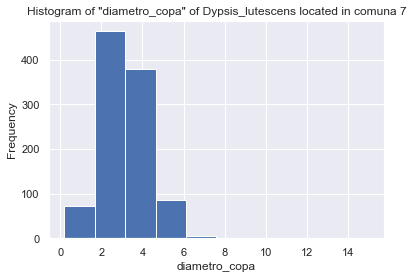

In [45]:
(df[(df.nom_cientifico == 'Dypsis_lutescens') & (df.comuna == 7) & (df.diametro_copa != '<NULL>')].diametro_copa).astype('float').plot(kind='hist')
plt.title('Histogram of "diametro_copa" of Dypsis_lutescens located in comuna 7')
plt.xlabel('diametro_copa')

The median of these values will be used for filling the null value.

In [46]:
dypsis_median = df[(df.nom_cientifico == 'Dypsis_lutescens') & (df.comuna == 7) & (df.diametro_copa != '<NULL>')].diametro_copa.median()
df.at[857, 'diametro_copa'] = dypsis_median

Text(0.5, 0, 'diametro_copa')

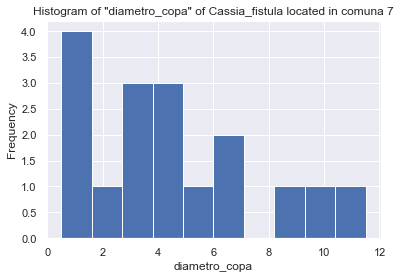

In [47]:
(df[(df.nom_cientifico == 'Cassia_fistula') & (df.comuna == 7) & (df.diametro_copa != '<NULL>')].diametro_copa).astype('float').plot(kind='hist')
plt.title('Histogram of "diametro_copa" of Cassia_fistula located in comuna 7')
plt.xlabel('diametro_copa')

The mean of these values will be used for filling the null value.

In [48]:
cassia_mean = round((df[(df.nom_cientifico == 'Cassia_fistula') & (df.comuna == 7) & (df.diametro_copa != '<NULL>')].diametro_copa).astype('float').mean(), 1)
df.at[1720, 'diametro_copa'] = cassia_mean

Text(0.5, 0, 'diametro_copa')

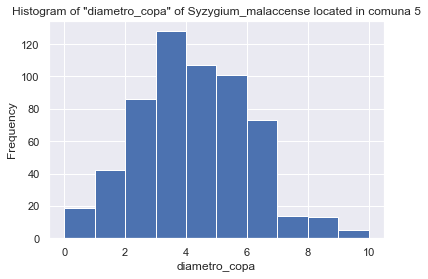

In [49]:
(df[(df.nom_cientifico == 'Syzygium_malaccense') & (df.comuna == 5) & (df.diametro_copa != '<NULL>')].diametro_copa).astype('float').plot(kind='hist')
plt.title('Histogram of "diametro_copa" of Syzygium_malaccense located in comuna 5')
plt.xlabel('diametro_copa')

The mean of these values will be used for filling the null value.

In [50]:
syzygium_mean = round((df[(df.nom_cientifico == 'Syzygium_malaccense') & (df.comuna == 5) & (df.diametro_copa != '<NULL>')].diametro_copa).astype('float').mean(), 1)
df.at[50485, 'diametro_copa'] = syzygium_mean

Now let's change type of these columns with float values.

In [51]:
for column in float_columns:
    df[column] = df[column].astype('float')

In [52]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101285 entries, 0 to 101284
Data columns (total 56 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   OBJECTID            101285 non-null  int64         
 1   OBJECTID_1          101285 non-null  int64         
 2   Codigo_Uni          101285 non-null  object        
 3   fecha               101285 non-null  datetime64[ns]
 4   municipio           101285 non-null  object        
 5   comuna              101285 non-null  category      
 6   zona                101285 non-null  object        
 7   subzona             101285 non-null  object        
 8   cod_censista        101285 non-null  object        
 9   num_arbol           101285 non-null  object        
 10  familia             101285 non-null  category      
 11  nom_cientifico      101285 non-null  category      
 12  nom_comun           101285 non-null  category      
 13  procedencia         101285 no

## EDA

### Correlation Analysis

In [53]:
# A correlation matriz without unnecessaty columns like comuna and objetid
df.drop(['OBJECTID','OBJECTID_1', 'comuna'], axis=1).corr()

,altura_fuste,altura_total,diametro_copa,diametro_normal,volumen_m3,inc,rd,dm,bbs,abs,pi,ph,pa,pd,pe,pp,po,r_vol,r_cr,r_ce
altura_fuste,1.000000,0.741746,0.490627,0.569619,0.602432,0.073794,0.189200,0.066171,-0.213231,0.051044,0.086166,0.022882,-0.031155,0.107472,0.296035,0.074691,0.028945,0.201701,0.328589,0.089516
altura_total,0.741746,1.000000,0.743253,0.774950,0.827944,0.043655,0.217247,0.032115,-0.287352,0.083224,0.061494,0.033520,-0.027169,0.149574,0.310806,0.101883,0.036202,0.195788,0.373910,0.095182
diametro_copa,0.490627,0.743253,1.000000,0.746907,0.712996,0.090868,0.283581,0.101313,-0.193916,0.097628,0.133772,0.057593,-0.017680,0.162558,0.344314,0.111063,0.053698,0.167532,0.370251,0.075432
diametro_normal,0.569619,0.774950,0.746907,1.000000,0.920805,0.022702,0.277622,0.104047,-0.318473,0.127321,0.081986,0.049228,-0.019217,0.200459,0.356361,0.139186,0.050925,0.183422,0.392654,0.078730
volumen_m3,0.602432,0.827944,0.712996,0.920805,1.000000,0.013898,0.237342,0.048310,-0.243675,0.098343,0.059953,0.033077,-0.013711,0.161096,0.338837,0.131637,0.031346,0.165062,0.367181,0.060953
inc,0.073794,0.043655,0.090868,0.022702,0.013898,1.000000,0.133471,0.178398,0.161840,0.124431,0.132746,0.025772,0.015208,0.142930,0.062872,0.022380,0.050420,0.354907,0.165016,0.060784
rd,0.189200,0.217247,0.283581,0.277622,0.237342,0.133471,1.000000,0.219200,-0.004304,0.107099,0.150812,0.052573,-0.000025,0.136974,0.206228,0.052910,0.044980,0.162246,0.206009,0.068753
dm,0.066171,0.032115,0.101313,0.104047,0.048310,0.178398,0.219200,1.000000,0.033578,0.295280,0.291955,0.109595,0.022182,0.267980,0.154125,0.035102,0.109367,0.198548,0.180033,0.038429
bbs,-0.213231,-0.287352,-0.193916,-0.318473,-0.243675,0.161840,-0.004304,0.033578,1.000000,-0.022397,0.004543,-0.043604,0.022923,-0.048383,-0.089378,-0.030868,-0.010688,-0.065709,-0.084387,-0.039058
abs,0.051044,0.083224,0.097628,0.127321,0.098343,0.124431,0.107099,0.295280,-0.022397,1.000000,0.155596,0.099729,0.030368,0.399004,0.083107,0.046980,0.050116,0.256603,0.185062,0.060848


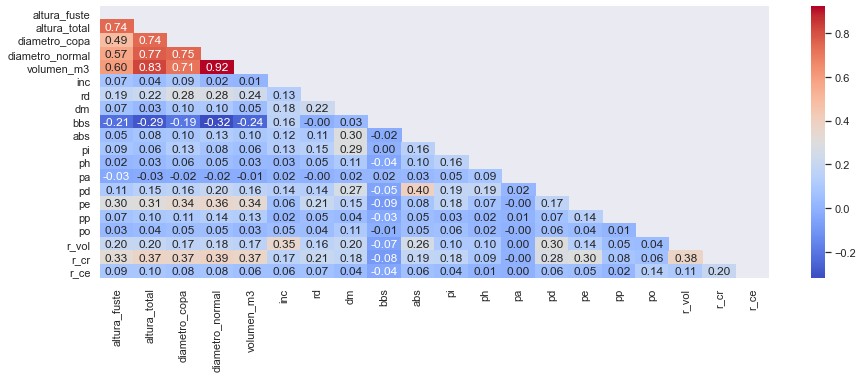

In [54]:
#A heatmap plot for all comunas at Ibague
plt.figure(figsize=(15, 5)) # We can set the size using matplotlib
corr=df.drop(['OBJECTID','OBJECTID_1', 'comuna'], axis=1).corr()
sns.heatmap(corr,cmap="coolwarm",annot=True,fmt='.2f', #annot true to show numbers into squares
mask = np.triu(np.ones_like(corr, dtype=bool))); # cmap defines the color palette

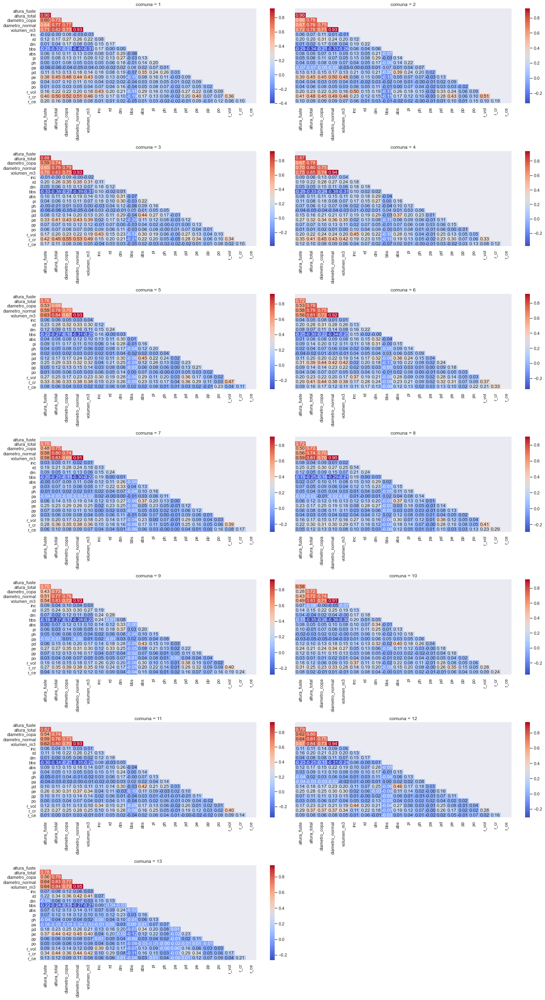

In [55]:
#A heatmap plot for each comuna at Ibague
g=sns.FacetGrid(df,col="comuna",col_wrap=2,height=5,aspect=2,sharex=False)
g.map_dataframe(lambda data, color: sns.heatmap(data.drop(['OBJECTID','OBJECTID_1','comuna'],axis=1).corr(),cmap="coolwarm",annot=True,fmt='.2f',mask = np.triu(np.ones_like(1,shape=(20,20), dtype=bool))));

### Categorical Variables Analysis

In [56]:
categorical_variables = ['familia', 'nom_cientifico', 'nom_comun', 'procedencia', 'UICN',
                         'habito_crecimiento', 'emplazamiento', 'estado_sanitario', 'densidad_follaje',
                         'valor_estetico', 'cre', 'crh', 'cra', 'coa', 'ce', 'civ', 'crt', 'crg', 'cap']

In [57]:
def barh_categorical(column_name):
    df[column_name].value_counts()[:20].sort_values().plot(kind='barh', figsize=(8, 8))
    for index, value in enumerate(reversed(df[column_name].value_counts()[:20])):
        plt.text(value, index, str(f' {value}'))
    plt.xlabel('Count')
    plt.ylabel(f'{column_name}')
    plt.title(f'Barplot of {column_name}')

In [58]:
def bar_categorical(column_name, rotation=0):
    ax = df[column_name].value_counts().plot(kind='bar', figsize=(10, 10))
    # df[column_name].value_counts().sort_values().plot(kind='bar', figsize=(10, 10))
    plt.xlabel('Count')
    plt.xticks(rotation=rotation)
    plt.ylabel(f'{column_name}')
    plt.title(f'Barplot of {column_name}')

#### Counts of trees grouped by families

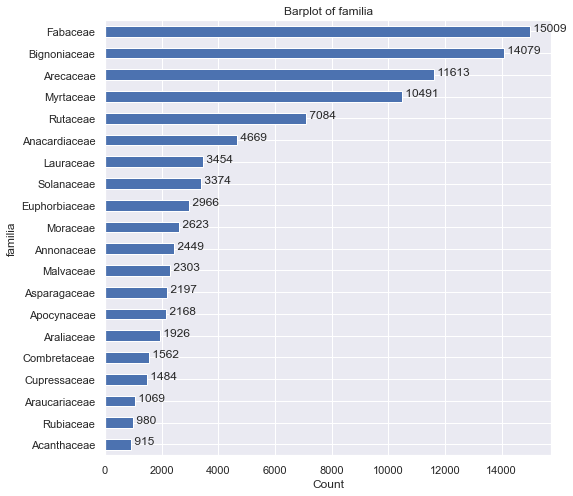

In [59]:
barh_categorical('familia')

#### Counts of trees grouped by their scientific names

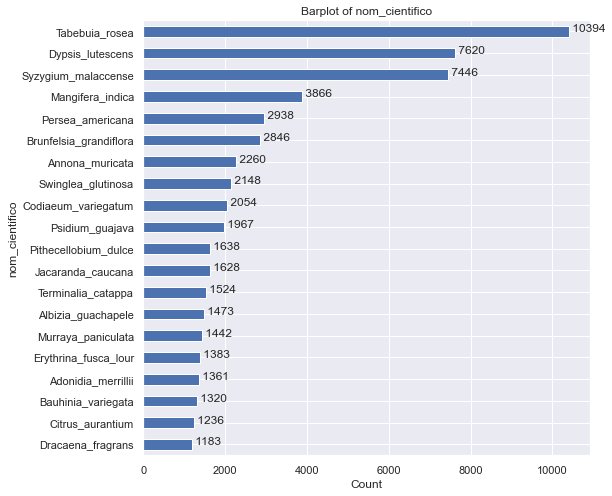

In [60]:
barh_categorical('nom_cientifico')

#### Counts of trees grouped by their common names

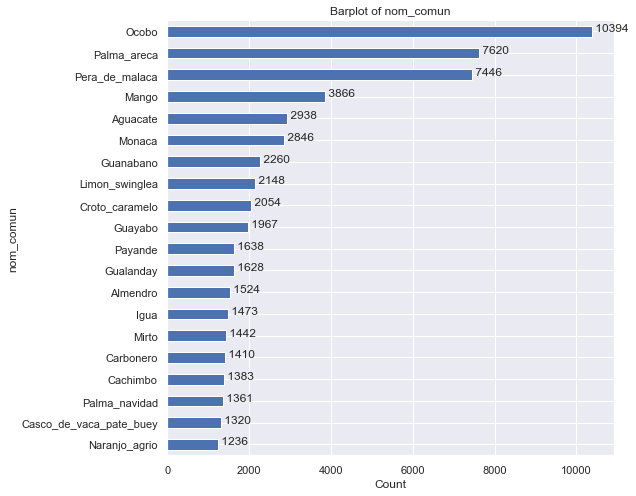

In [61]:
barh_categorical('nom_comun')

We can see that counts from nom_cientifico barplot and nom_comun barplot don't match. There's an extra value within nom_comun barplot: **Carbonero: 1410**. Let's see what happen with this tree in dataframe.

In [62]:
df[df.nom_comun == 'Carbonero'].head()

,OBJECTID,OBJECTID_1,Codigo_Uni,fecha,municipio,comuna,zona,subzona,cod_censista,num_arbol,familia,nom_cientifico,nom_comun,procedencia,UICN,habito_crecimiento,emplazamiento,altura_fuste,altura_total,diametro_copa,diametro_normal,volumen_m3,inc,rd,dm,bbs,abs,estado_fisico,pi,ph,pa,pd,pe,pp,po,estado_sanitario,densidad_follaje,valor_estetico,cre,crh,cra,coa,ce,civ,crt,crg,cap,r_vol,r_cr,r_ce,fotografia,fase,GlobalID,X,Y,Barrio
137,97737,40781,67719 - F3,2017-05-16,Ibague,7,4,4,Cuadrilla_4,67719,Fabaceae,Calliandra_surinamensis,Carbonero,Exotica,No_evaluado,Arbusto,Alcorque,0.3,3.0,3.0,3.5,0.057727,0,0,0,60,0,Bueno,0,0,0,0,0,0,0,Sano,Denso,Deseable,No,No,No,No,No,No,No,No,No,0,0,0,C:\Users\juan-arias.CORTOLI1\Documents\ArcGIS\...,F3,{60B014F6-0BF0-448E-BD73-87C1481DEA67},"883504,1471","984348,173",Otro
171,97264,61573,64158 - F3,2017-05-16,Ibague,7,4,4,Cuadrilla_16,64158,Fabaceae,Calliandra_magdalenae,Carbonero,Nativa,No_evaluado,Arbusto,Parque,1.8,3.5,3.5,4.5,0.086590,20,0,20,80,0,Bueno,0,0,0,0,0,0,0,Sano,Denso,Deseable,No,No,No,No,No,No,No,No,No,0,0,0,C:\Users\juan-arias.CORTOLI1\Documents\ArcGIS\...,F3,{96D8D8A5-8D18-449F-A39D-4369E6CF2671},"883482,6152","984300,1539",Otro
180,97292,67903,67634 - F3,2017-05-16,Ibague,7,4,4,Cuadrilla_3,67634,Fabaceae,Calliandra_magdalenae,Carbonero,Nativa,No_evaluado,Arbusto,Parque,1.3,3.1,3.4,3.6,0.061355,60,0,0,80,0,Regular,0,0,0,0,0,0,0,Sano,Denso,Deseable,No,No,No,Si,No,No,No,No,No,0,0,0,C:\Users\juan-arias.CORTOLI1\Documents\ArcGIS\...,F3,{C2B99747-C6F4-4C82-B0B3-53E430AAF630},"883480,211","984303,7157",Otro
325,93396,62973,67729 - F3,2017-05-16,Ibague,7,4,4,Cuadrilla_4,67729,Fabaceae,Calliandra_surinamensis,Carbonero,Exotica,No_evaluado,Arbusto,Alcorque,0.3,3.0,3.0,4.8,0.079168,0,0,0,40,0,Bueno,0,0,0,0,0,0,0,Sano,Denso,Deseable,No,No,No,No,No,No,No,No,No,0,0,0,C:\Users\juan-arias.CORTOLI1\Documents\ArcGIS\...,F3,{90461F7B-A5C1-419C-92CF-EDFB533EDB87},"883379,6532","984101,0896",Otro
332,97003,67421,69123 - F3,2017-05-16,Ibague,7,4,4,Cuadrilla_2,69123,Fabaceae,Calliandra_magdalenae,Carbonero,Nativa,No_evaluado,Arbusto,Zona_blanda,1.9,3.0,3.2,5.0,0.082467,20,0,80,0,0,Bueno,0,0,0,0,0,0,0,Sano,Denso,Deseable,No,No,No,No,No,No,No,No,No,0,0,0,C:\Users\juan-arias.CORTOLI1\Documents\ArcGIS\...,F3,{86468F3B-F3B3-4598-AC13-40A5B2F320A4},"883373,0198","984279,031",Otro


In [63]:
df[df.nom_comun == 'Carbonero'].nom_cientifico.value_counts()

Calliandra_magdalenae      636
Calliandra_riparia         501
Calliandra_surinamensis    232
Calliandra_purdiaei         41
Abarema_jupunba              0
                          ... 
Daphnopsis_cestrifolia       0
Cycas_rumphii                0
Cycas_revoluta               0
Cupressus_sempervirens       0
Zygia_longifolia             0
Name: nom_cientifico, Length: 427, dtype: int64

We can see that there are 4 species for same tree that is called 'Carbonero' in a common way by people in Ibagué. This is important to having account later: maybe it would not be a good idea grouping trees by their common names but their scientific names. This is going to be important only if we find significant differences between species from same family.

Let's see if we have more trees that have the same common name but they are from different species.

In [64]:
dicc_common_sci = {}
for common in df['nom_comun'].unique():
    sci_names = list(df[df.nom_comun == common].nom_cientifico.unique())
    if len(sci_names) > 1:
        dicc_common_sci[common] = sci_names

dicc_common_sci
    

{'Laurel': ['Cinnamomum_triplinerve', 'Ocotea_sp', 'Laurus_nobilis'],
 'Arrayan': ['Myrcia_sp', 'Eugenia_sp', 'Eugenia_biflora'],
 'Carbonero': ['Calliandra_surinamensis',
  'Calliandra_magdalenae',
  'Calliandra_riparia',
  'Calliandra_purdiaei'],
 'Millon': ['Polyscias_balfouriana', 'Polyscias_fruticosa'],
 'Arbol_de_la_felicidad': ['Dracaena_fragrans', 'Solanum_macranthum'],
 'Guamo_machete': ['Inga_densiflora', 'Inga_spectabilis'],
 'Moro': ['Cordia_sp', 'Ehretia_tinifolia'],
 'Chicala': ['Handroanthus_chrysanthus', 'Tabebuia_ochracea'],
 'Coca': ['Erythroxylum_coca', 'Erythroxylum_amazonicum', 'Erythroxylum_ulei'],
 'Zapote': ['Quararibea_cordata', 'Malus_domestica'],
 'Palma_real_palma_de_botella': ['Roystonea_regia', 'Roystonea_oleracea'],
 'Tachuelo': ['Zanthoxylum_rigidum', 'Zanthoxylum_schreberi'],
 'Cannafistulo': ['Cassia_fistula', 'Cassia_grandis'],
 'Higueron': ['Ficus_insipida', 'Ficus_maxima'],
 'Chocho': ['Ormosia_colombiana',
  'Erythrina_rubrinervia',
  'Adenanthera_

Now we can see that there are more trees that are called the same by people in Ibague but they belong to different species, even different genuses. This is important to have into account because when we will want to refer a tree, we can not use it's common name but it's scientific name for a better identification. For example, just look the tree called **'Chocho'**: there are 4 different species from 4 different genuses, this could be important!

Let's extract these trees that have same common name but they are from different genuses just for having this information in case we need later.

In [65]:
common_different_genuses = []
for common, sci_names in dicc_common_sci.items():
    genuses = [name.split('_')[0] for name in sci_names]
    if len(set(genuses)) > 1:
        common_different_genuses.append((common, sci_names))

common_different_genuses        

[('Laurel', ['Cinnamomum_triplinerve', 'Ocotea_sp', 'Laurus_nobilis']),
 ('Arrayan', ['Myrcia_sp', 'Eugenia_sp', 'Eugenia_biflora']),
 ('Arbol_de_la_felicidad', ['Dracaena_fragrans', 'Solanum_macranthum']),
 ('Moro', ['Cordia_sp', 'Ehretia_tinifolia']),
 ('Chicala', ['Handroanthus_chrysanthus', 'Tabebuia_ochracea']),
 ('Zapote', ['Quararibea_cordata', 'Malus_domestica']),
 ('Chocho',
  ['Ormosia_colombiana',
   'Erythrina_rubrinervia',
   'Adenanthera_pavonina',
   'Ormosia_coccinea']),
 ('Lechoso', ['Trophis_caucana', 'Sorocea_sp']),
 ('Lechero', ['Sapium_sp', 'Brosimum_sp'])]

#### Counts of trees grouped by origin

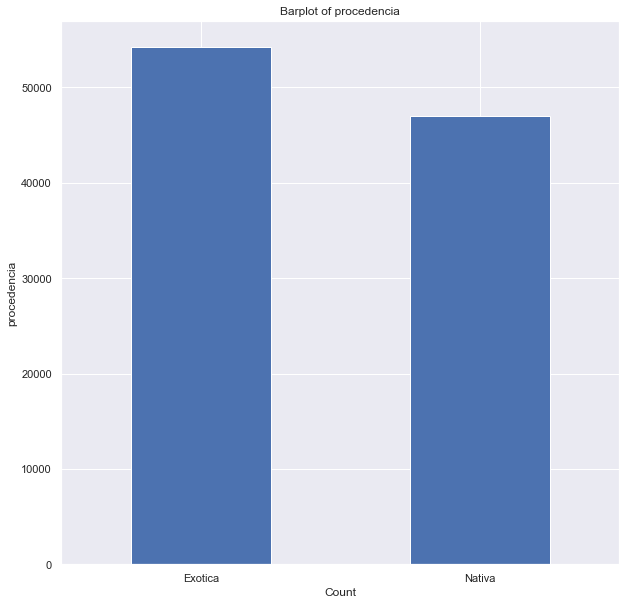

In [66]:
bar_categorical('procedencia');

As we can see, there are more exotics trees than native trees in Ibague.

#### Counts of trees grouped by their state qualified by UICN

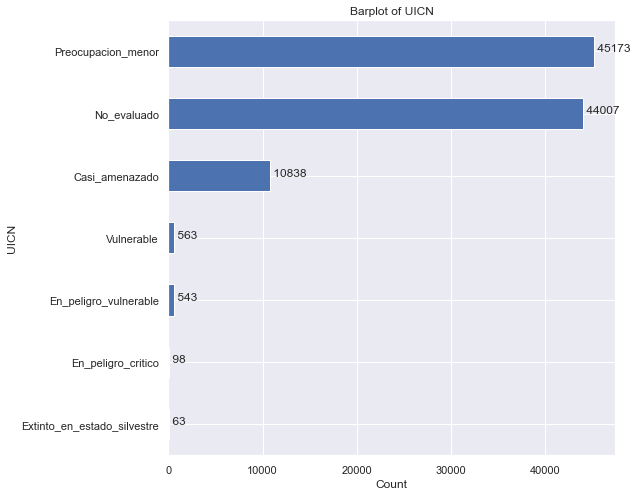

In [67]:
barh_categorical('UICN')

It can be observed that there are many trees in vulnerable states (Casi_amenazado, vulnerable, En_peligro_vulnerable, En_peligro_critico, Extinto_en_estado_silvestre). In fact, there are 12105 trees in all of these states. It's important to talk with people from mayoralty of Ibague to ask them what types of these states they are interested in. Also it's very important to have into account that this data is collected between 2014 and 2017, so maybe many trees could be in a worse state or maybe dead. There's a category called 'No evaluated'; for trees with this category, maybe would be important analyzing the other variables for conclude if they are in a good or vulnerable state.

#### Counts of trees grouped by their growth habit

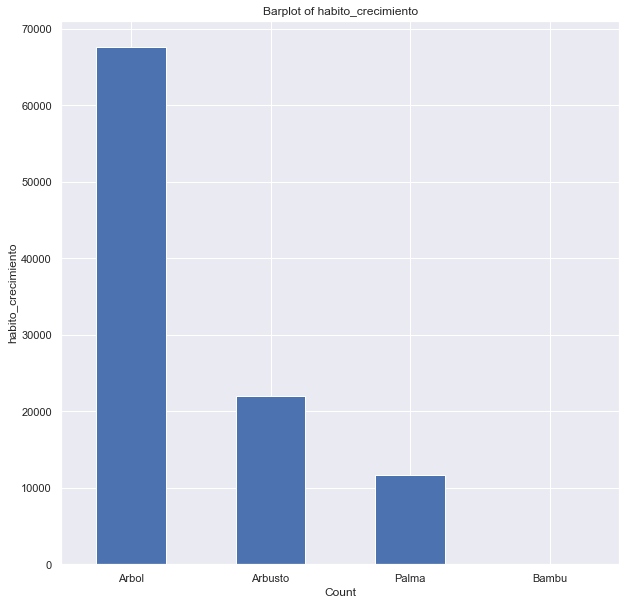

In [68]:
bar_categorical('habito_crecimiento')

We can see that trees predominate over shrubs, palms and bamboo. And maybe this is important: trees provide more shadow than other plants, so maybe we will want to work just with trees in order to decrease temperature in Ibague.

#### Counts of trees grouped by the type of site where they are located

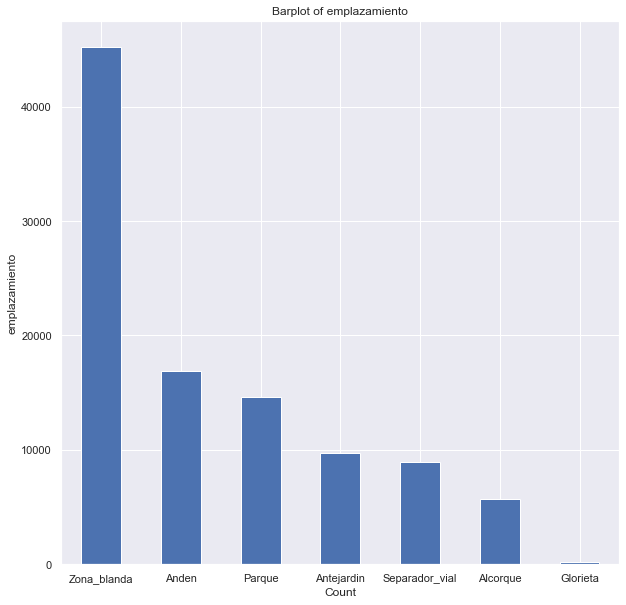

In [69]:
bar_categorical('emplazamiento')

We can see most trees by far are located in 'Zona blanda'. We need to ask to people from mayoralty what kind of location it is.

#### Counts of trees grouped by Health status

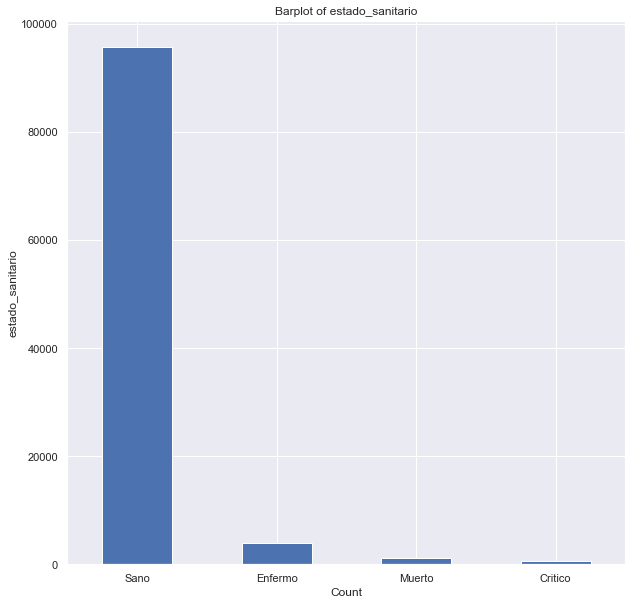

In [70]:
bar_categorical('estado_sanitario')

According to this classification, we find that most trees are healthy. However, there are 4428 trees that are unhealthy and 1107 are dead. We will try to cross this information with UICN classification in order to look someting interesting.

#### Counts of trees grouped by their foliage density

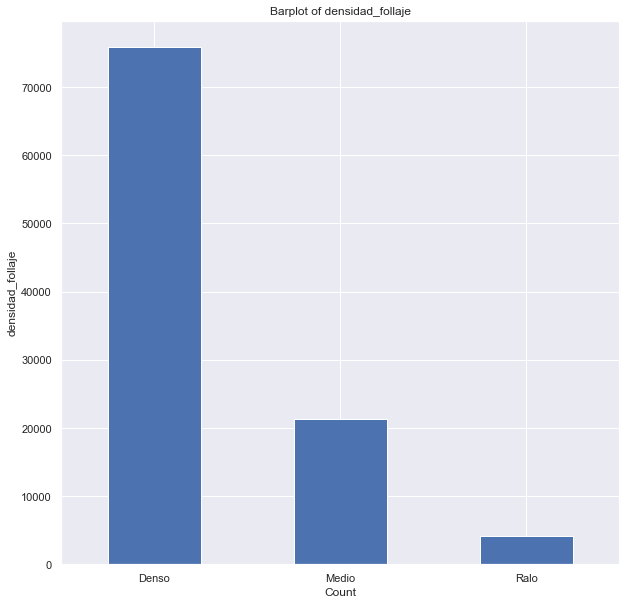

In [71]:
bar_categorical('densidad_follaje')

Most trees have dense foliage. Maybe this type of trees will be most useful for decreasing temperature in Ibague. This is because more density could mean more [transpiration cooling](https://eco-intelligent.com/2020/05/23/why-is-it-cooler-around-trees/amp/) and lower temperatures.

#### Counts of trees grouped by their aesthetic value

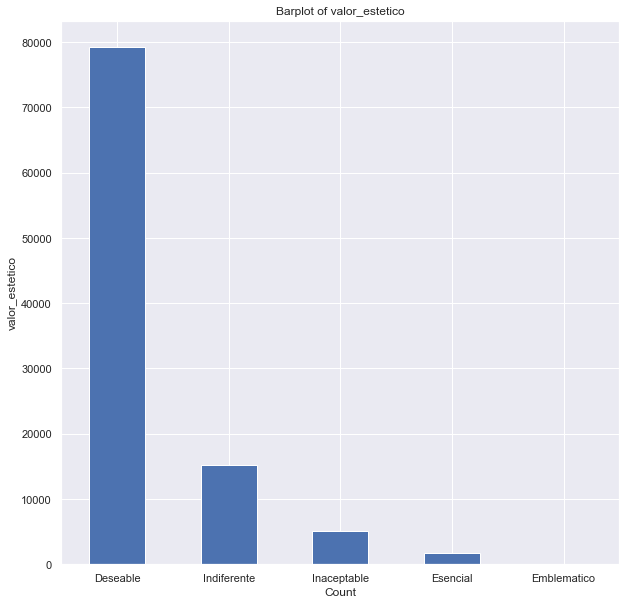

In [72]:
bar_categorical('valor_estetico')

We can see most trees have a good aesthetic value, however there are 2108 that have not. We need to ask about what mean 'Emblematico', 'Esencial' and 'Indiferente' categories.

#### Counts of trees that present any type of conflict

In [73]:
c_columns = ['cre', 'crh', 'cra', 'coa', 'ce', 'civ', 'crt', 'crg', 'cap']

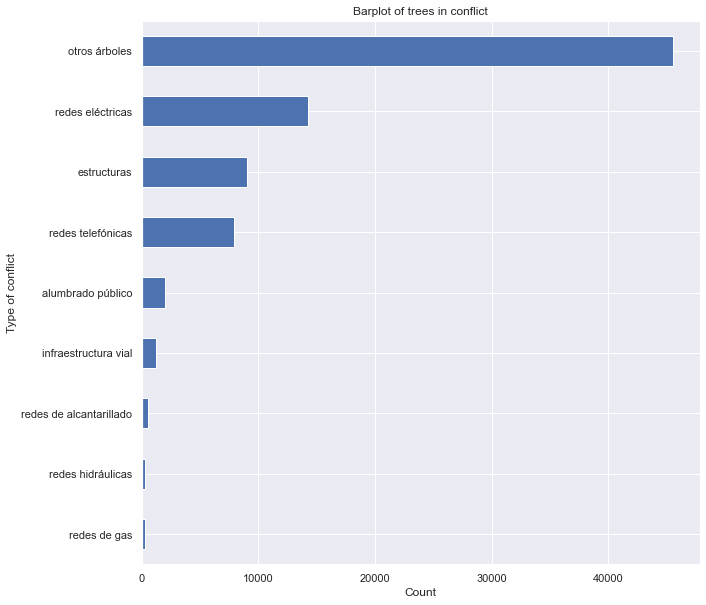

In [74]:
conflictos = {
    'cre': 'redes eléctricas',
    'crh':'redes hidráulicas',
    'cra':'redes de alcantarillado',
    'coa':'otros árboles',
    'ce':'estructuras',
    'civ':'infraestructura vial',
    'crt':'redes telefónicas',
    'crg':'redes de gas',
    'cap':'alumbrado público',
}

c_data = df[c_columns].rename(columns=conflictos).replace({'Si':1, 'No':0})
ax = c_data.sum().sort_values().plot(kind='barh', figsize=(10, 10))    
plt.title('Barplot of trees in conflict')
plt.xlabel('Count')
plt.ylabel('Type of conflict')
plt.show()

We can see that type of conflict most of trees present is conflict with other trees. It's important to do something with all of the other categories because these conflict could be very serious as conflict with gas networks for example.

#### Analysis per 'Comuna'

##### Counts of trees per comuna

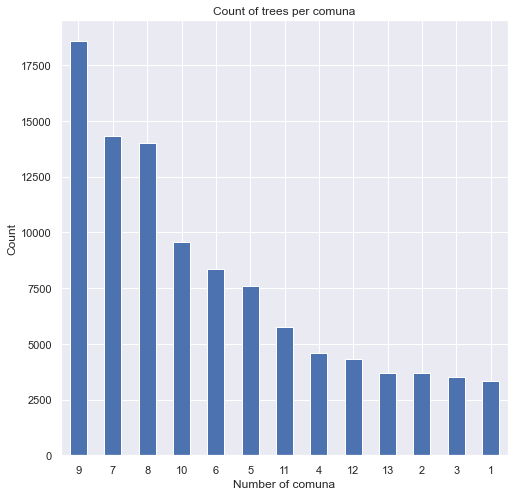

In [75]:
df.comuna.value_counts().plot(kind='bar', figsize=(8,8))
plt.title('Count of trees per comuna')
plt.xlabel('Number of comuna')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()

We can see that comunas 9, 7 and 8 are the ones with most trees. Maybe we would want to work in comunas 1, 2, 3, 4, 12 and 13 which have the lowest values. However, we need to first investigate why this is happening: maybe there is not enought area able to grow trees in these comunas.

##### Counts of trees by their specie per comuna

In [76]:

for i in range(1, 13+1):
    print(f'Comuna {i}')
    comuna_counts = df[df.comuna == i].nom_cientifico.value_counts().head()
    print(comuna_counts)

Comuna 1
Dypsis_lutescens          472
Tabebuia_rosea            384
Adonidia_merrillii        226
Brunfelsia_grandiflora    129
Senna_spectabilis         110
Name: nom_cientifico, dtype: int64
Comuna 2
Dypsis_lutescens          377
Brunfelsia_grandiflora    243
Tabebuia_rosea            210
Myrsine_guianensis        150
Myrcia_splendens          143
Name: nom_cientifico, dtype: int64
Comuna 3
Tabebuia_rosea            486
Dypsis_lutescens          217
Syzygium_malaccense       166
Mangifera_indica          146
Brunfelsia_grandiflora    117
Name: nom_cientifico, dtype: int64
Comuna 4
Tabebuia_rosea            552
Dypsis_lutescens          349
Syzygium_malaccense       250
Senna_siamea              172
Brunfelsia_grandiflora    171
Name: nom_cientifico, dtype: int64
Comuna 5
Tabebuia_rosea         807
Dypsis_lutescens       619
Syzygium_malaccense    589
Mangifera_indica       296
Persea_americana       238
Name: nom_cientifico, dtype: int64
Comuna 6
Tabebuia_rosea            813
Dypsis

In [77]:
species_list = []

with open('comuna_counts.csv', 'w') as file:
    for i in range(1, 13+1):
        file.write(f'Comuna {i}\n')
        file.write(f'Specie,Count\n')
        comuna_counts = df[df.comuna == i].nom_cientifico.value_counts().head()
        for specie, count in comuna_counts.iteritems():
            species_list.append(specie)
            file.write(f'{specie},{count}\n')

In [78]:
from collections import Counter

In [79]:
species_counter = Counter(species_list)
print(species_counter)

Counter({'Dypsis_lutescens': 13, 'Tabebuia_rosea': 13, 'Syzygium_malaccense': 9, 'Brunfelsia_grandiflora': 7, 'Mangifera_indica': 7, 'Persea_americana': 3, 'Psidium_guajava': 2, 'Adonidia_merrillii': 1, 'Senna_spectabilis': 1, 'Myrsine_guianensis': 1, 'Myrcia_splendens': 1, 'Senna_siamea': 1, 'Annona_muricata': 1, 'Albizia_guachapele': 1, 'Codiaeum_variegatum': 1, 'Swinglea_glutinosa': 1, 'Guarea_guidonia': 1, 'Jacaranda_caucana': 1})


In [80]:
def variable_per_comuna(variable):
    df.groupby('comuna')[variable].value_counts().unstack(1).plot.bar(figsize=(30, 15))
    plt.title('')
    plt.xticks(rotation=0)
    plt.show()

##### Counts of trees gruped by the site location per comuna

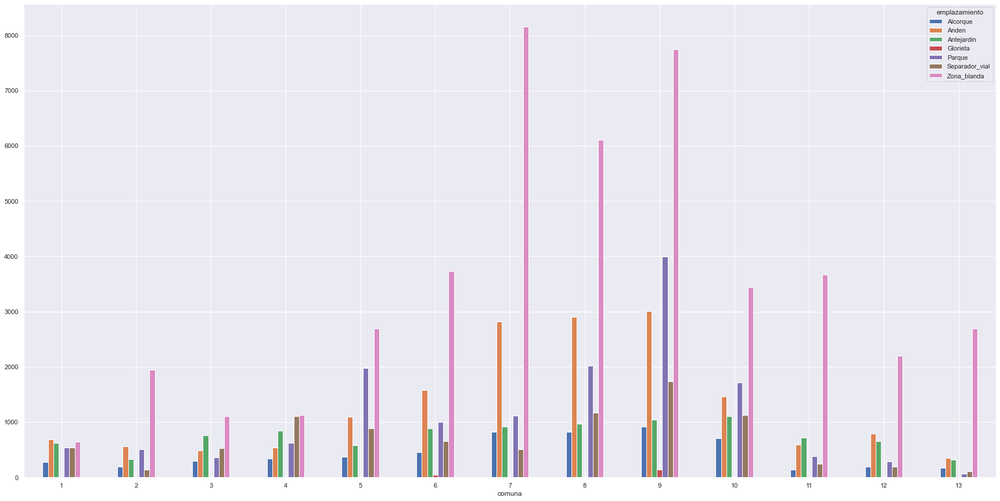

In [81]:
variable_per_comuna('emplazamiento')

##### Counts of trees gruped by origin per comuna

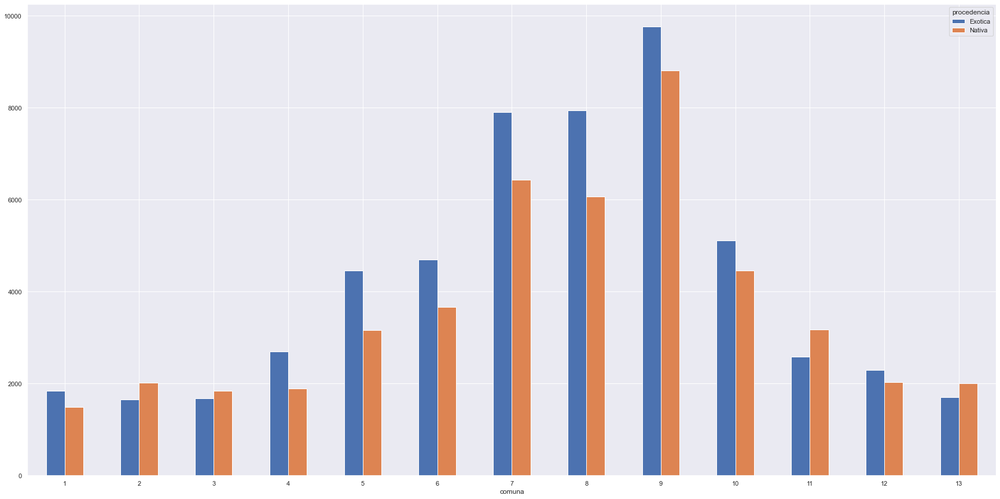

In [82]:
variable_per_comuna('procedencia')

##### Counts of trees gruped by their UICN qualification per comuna

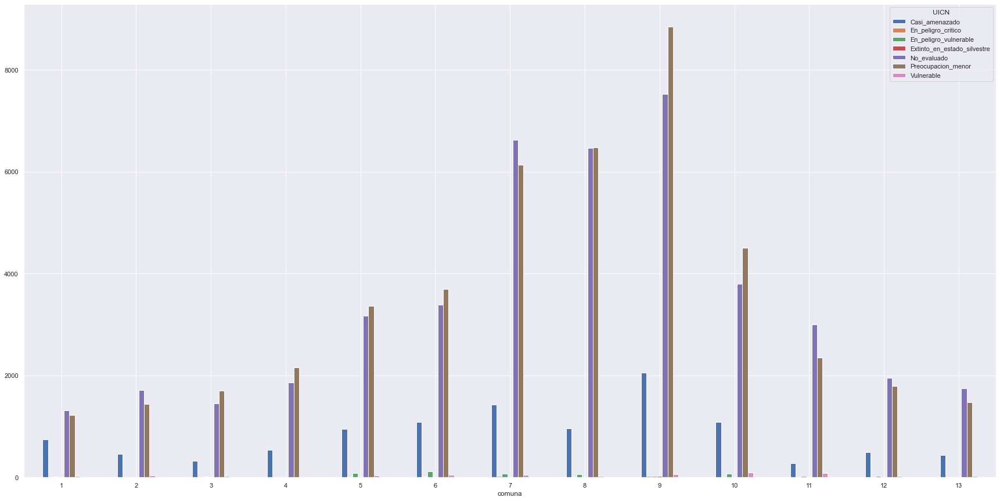

In [83]:
variable_per_comuna('UICN')

##### Counts of trees gruped by their growth habit per comuna

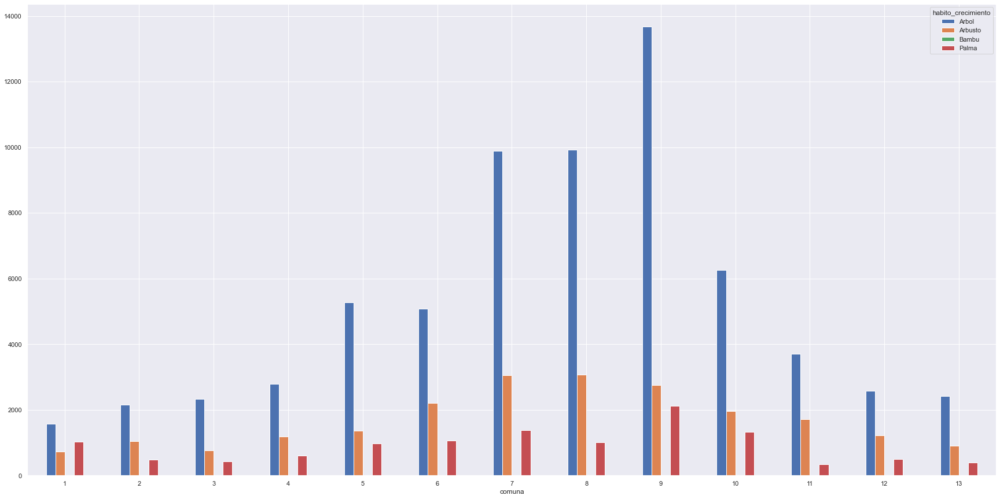

In [84]:
variable_per_comuna('habito_crecimiento')

##### Counts of trees gruped by health state per comuna

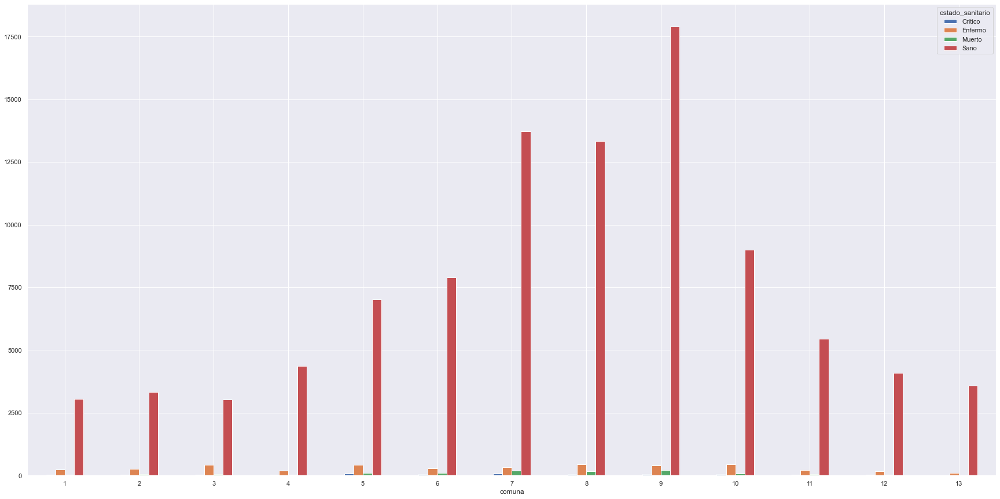

In [85]:
variable_per_comuna('estado_sanitario')

##### Counts of trees gruped by foliage density per comuna

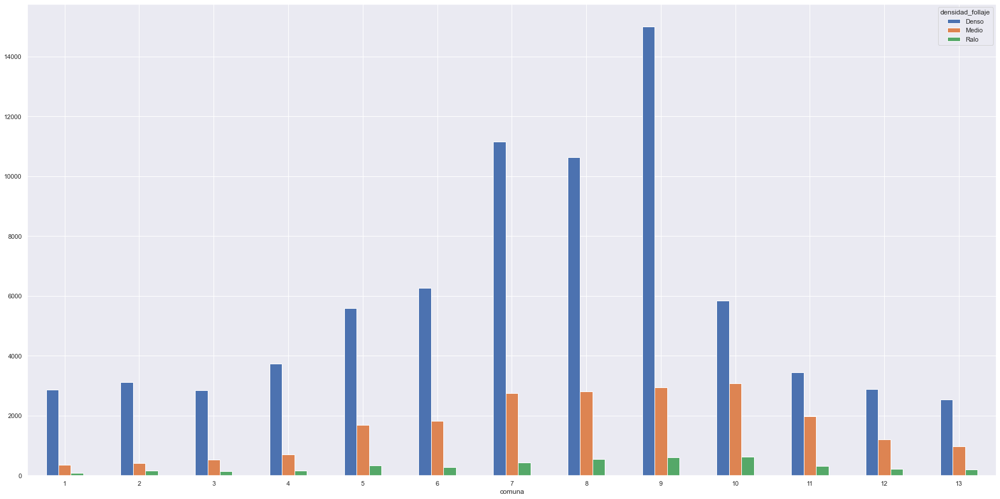

In [86]:
variable_per_comuna('densidad_follaje')

##### Counts of trees gruped by aesthetic vale per comuna

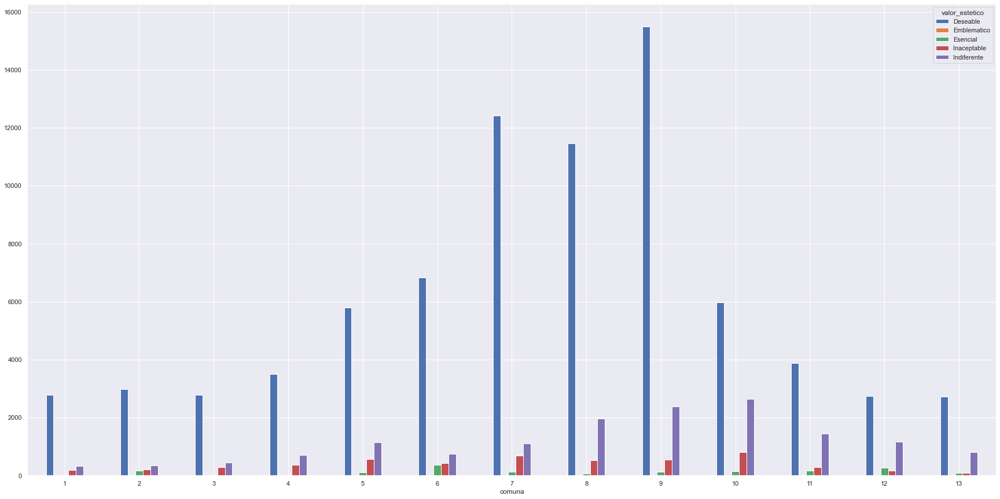

In [87]:
variable_per_comuna('valor_estetico')

### Boxplots Analysis

#### Univariados

In [88]:
var_cat=['comuna','procedencia',
         'UICN','habito_crecimiento','emplazamiento','estado_fisico',
         'estado_sanitario','densidad_follaje','valor_estetico','cre','crh',
         'cra','coa','ce','civ','crt','crg','cap',
         #'rd',
         #'ph',
         #'pa',
         #'pd',
         #'pe',
         #'pp',
         #'r_vol',
         #'r_cr',
         #'r_ce'
        ]
var_num=['altura_fuste',
         'altura_total',
         'diametro_copa',
         'diametro_normal',
         'volumen_m3',
         #'inc',
         #'rd',
         #'dm',
         'bbs',
         #'pi',
         #'ph',
         #'pa',
         #'pd',
         #'pe',
         #'pp',
         #'r_vol',
         #'r_cr',
         #'r_ce'
        ]

In [89]:
df[var_num].mean()

altura_fuste        2.715306
altura_total        5.844057
diametro_copa       4.085422
diametro_normal    16.560477
volumen_m3          0.799472
bbs                27.663524
dtype: float64

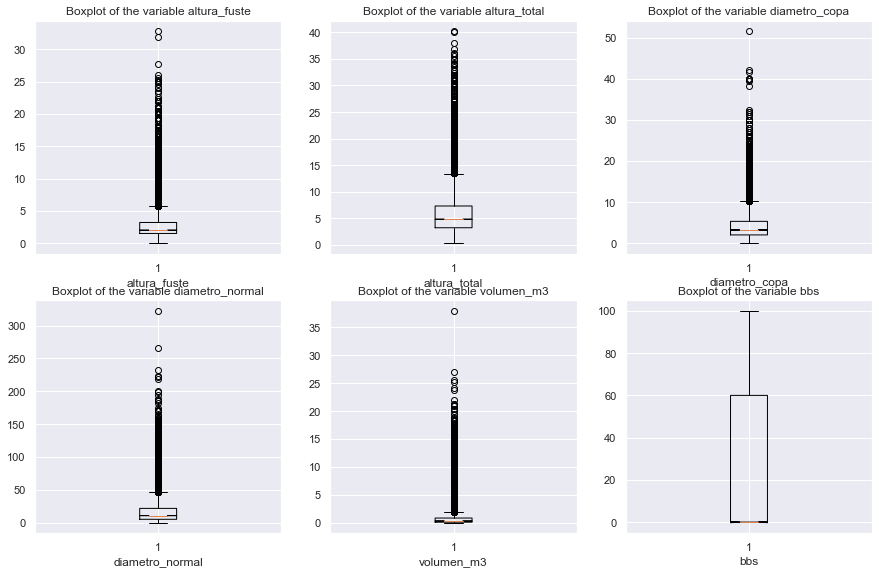

In [90]:
#  plot Numerical Data
a = len(var_num)  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

f, ax = plt.subplots(figsize=(15, 30))
ax.set_yscale("log")
for i in var_num:
    plt.subplot(a, b, c)
    plt.title('Boxplot of the variable {}'.format(i))
    plt.xlabel(i)
    plt.boxplot(x = df[i],notch ='True')
    c = c + 1
    
plt.show();

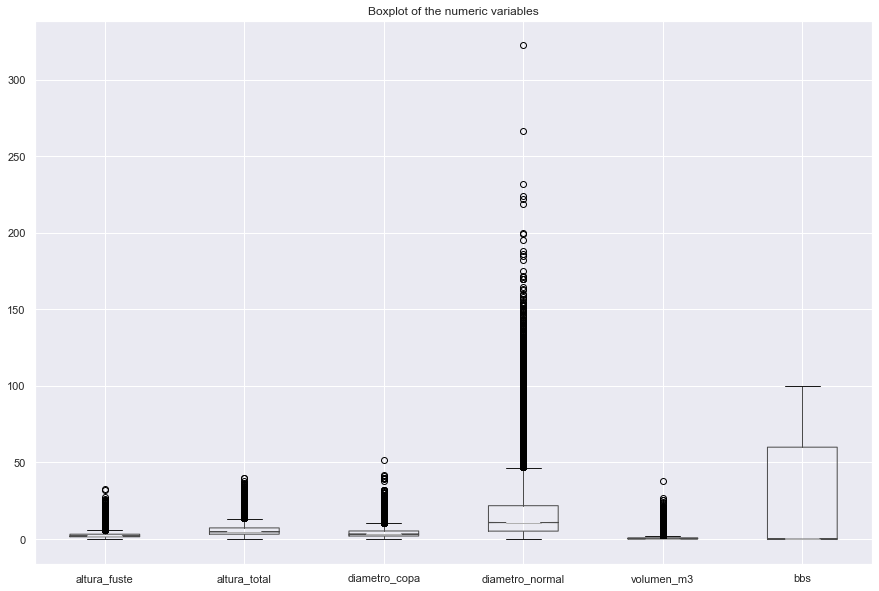

In [91]:
fig = plt.figure(figsize=(15,10))
df.boxplot(column=var_num, notch ='True')
plt.title('Boxplot of the numeric variables');

In [92]:
df[var_num].median()

altura_fuste        2.000000
altura_total        4.800000
diametro_copa       3.200000
diametro_normal    10.800000
volumen_m3          0.293583
bbs                 0.000000
dtype: float64

In [93]:
df[var_num].max()

altura_fuste        32.800000
altura_total        40.200000
diametro_copa       51.500000
diametro_normal    322.300000
volumen_m3          37.930422
bbs                100.000000
dtype: float64

Most of the graphics seems to have a great quantity of values far from their mean. That could tell us, that a normalization of the avriables is very important for modeling. Also, we can see that most of the distributions as skwed to one side, specially altura_fueste, altura_total,diametro_copa, diametro_normal y volumen_m3.

#### Bi-variated

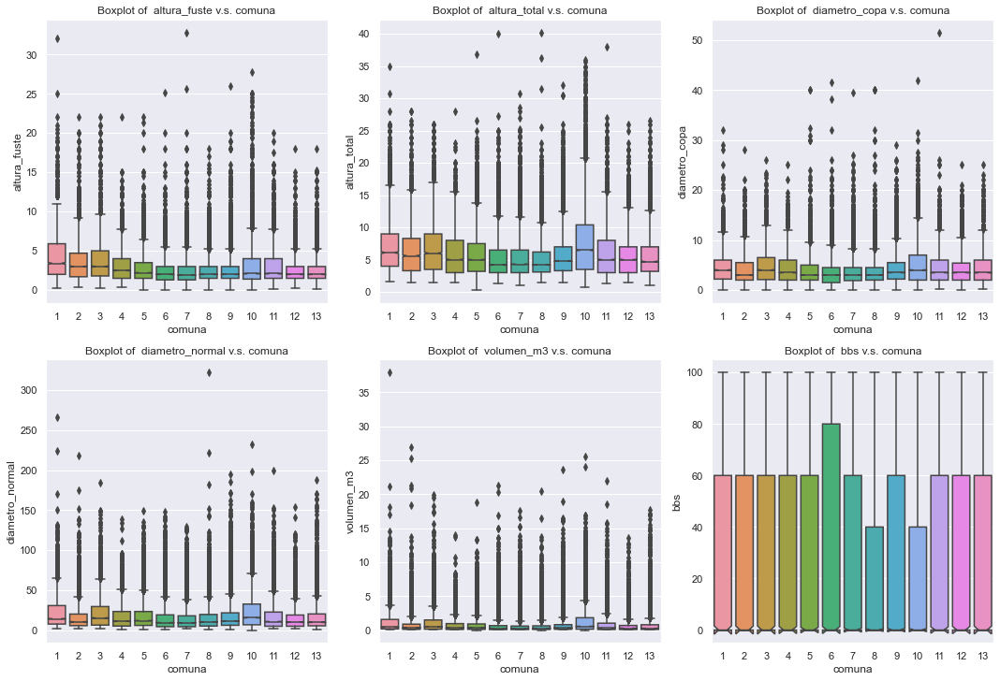

In [94]:
#  plot Numerical Data
a = len(var_num)  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(15,30))

for i in var_num:
    plt.subplot(a, b, c)
    plt.title('Boxplot of  {} v.s. {}'.format(i, var_cat[0]))
    plt.xlabel(i)
    sns.boxplot(y = df[i], x=df[var_cat[0]],notch ='True')
    c = c + 1
    
plt.tight_layout()
plt.show();

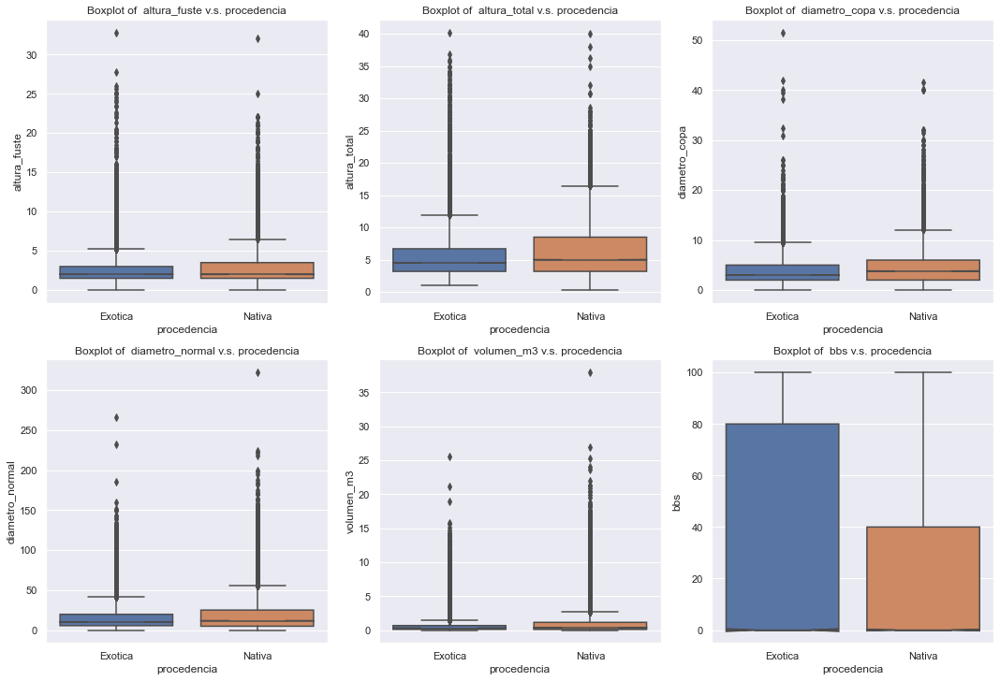

In [95]:
#  plot Numerical Data
a = len(var_num)  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(15,30))

for i in var_num:
    plt.subplot(a, b, c)
    plt.title('Boxplot of  {} v.s. {}'.format(i, var_cat[1]))
    plt.xlabel(i)
    sns.boxplot(y = df[i], x=df[var_cat[1]],notch ='True')
    c = c + 1
    
plt.tight_layout()
plt.show();

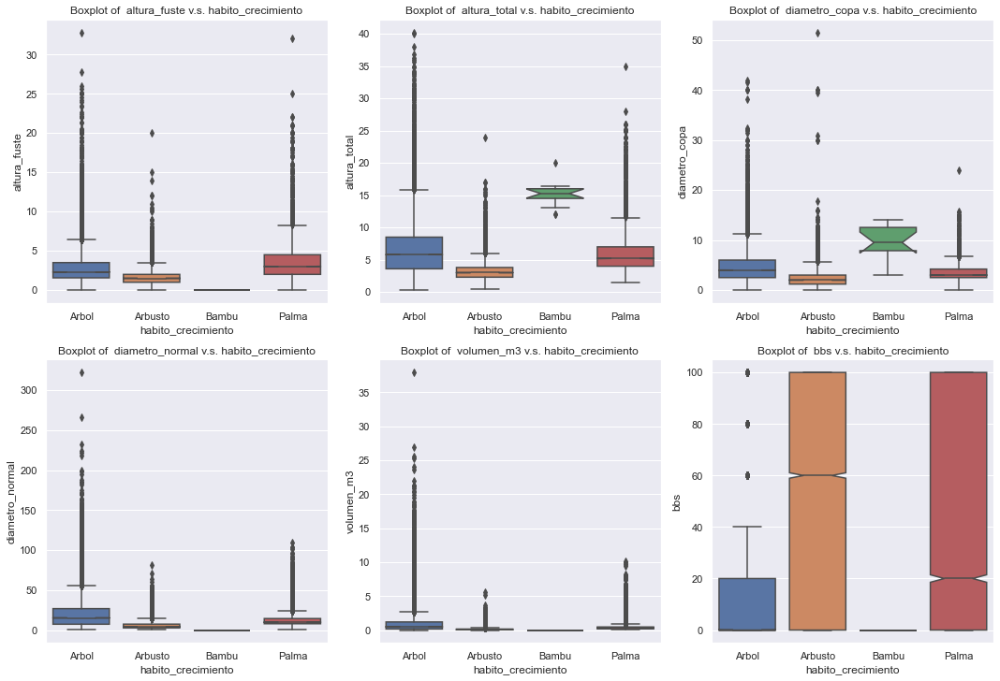

In [96]:
#  plot Numerical Data
a = len(var_num)  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(15,30))

for i in var_num:
    plt.subplot(a, b, c)
    plt.title('Boxplot of  {} v.s. {}'.format(i, var_cat[3]))
    plt.xlabel(i)
    sns.boxplot(y = df[i], x=df[var_cat[3]],notch ='True')
    c = c + 1
    
plt.tight_layout()
plt.show();

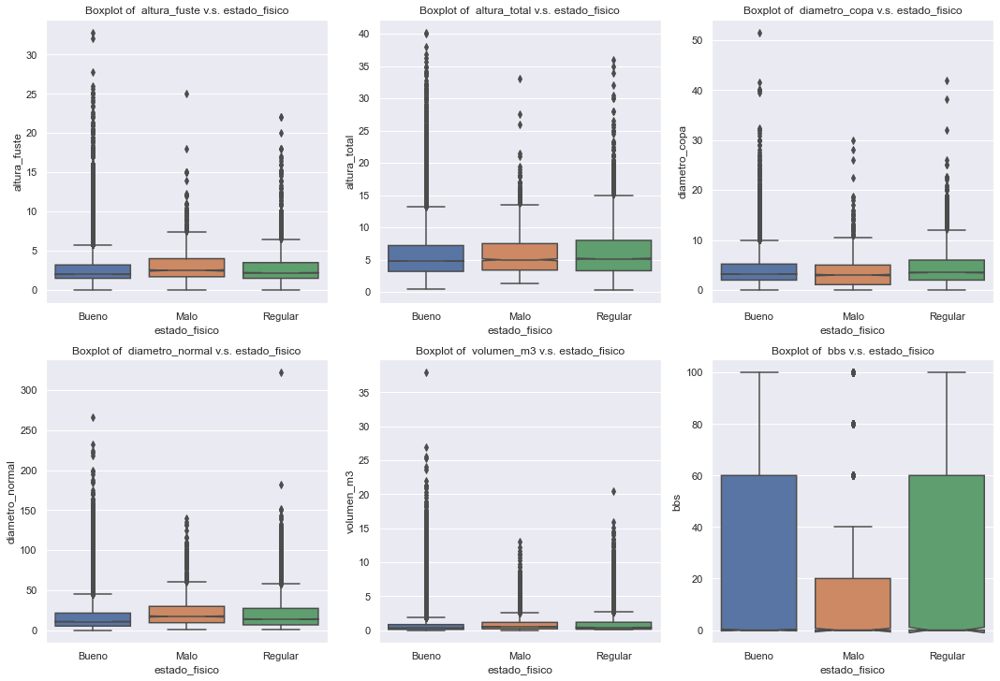

In [97]:
#  plot Numerical Data
a = len(var_num)  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(15,30))

for i in var_num:
    plt.subplot(a, b, c)
    plt.title('Boxplot of  {} v.s. {}'.format(i, var_cat[5]))
    plt.xlabel(i)
    sns.boxplot(y = df[i], x=df[var_cat[5]],notch ='True')
    c = c + 1
    
plt.tight_layout()
plt.show();

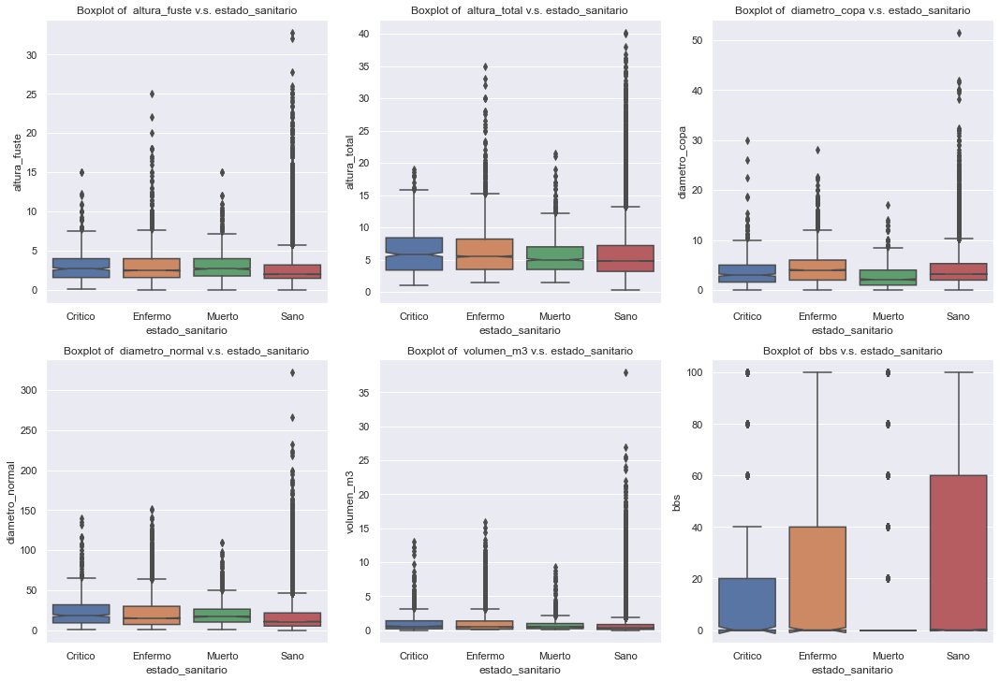

In [98]:
#  plot Numerical Data
a = len(var_num)  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(15,30))

for i in var_num:
    plt.subplot(a, b, c)
    plt.title('Boxplot of  {} v.s. {}'.format(i, var_cat[6]))
    plt.xlabel(i)
    sns.boxplot(y = df[i], x=df[var_cat[6]],notch ='True')
    c = c + 1
    
plt.tight_layout()
plt.show();

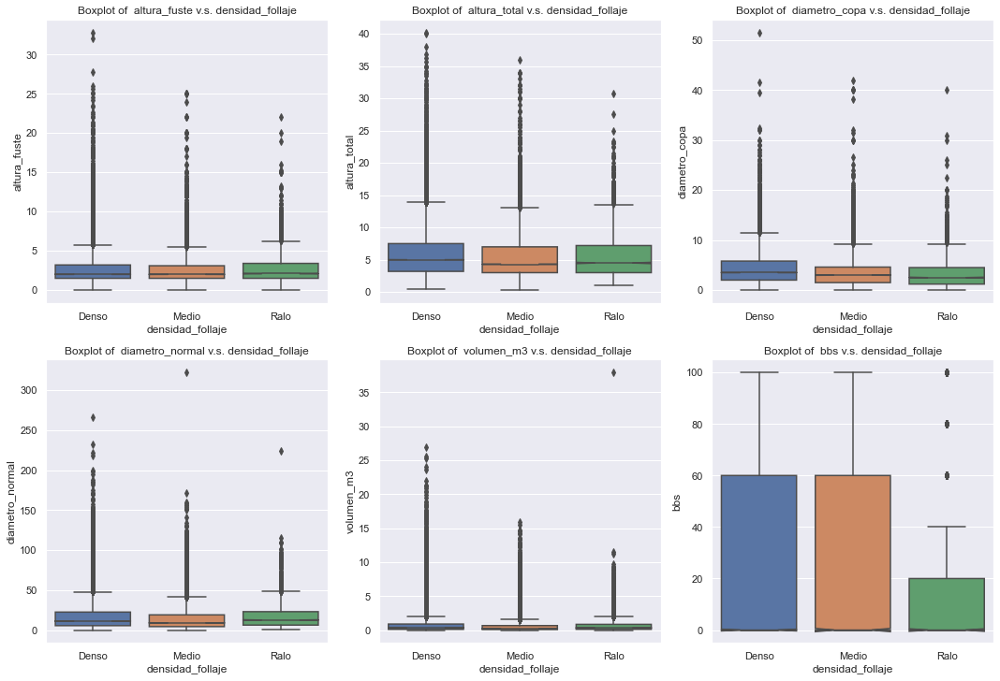

In [99]:
#  plot Numerical Data
a = len(var_num)  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(15,30))

for i in var_num:
    plt.subplot(a, b, c)
    plt.title('Boxplot of  {} v.s. {}'.format(i, var_cat[7]))
    plt.xlabel(i)
    sns.boxplot(y = df[i], x=df[var_cat[7]],notch ='True')
    c = c + 1
    
plt.tight_layout()
plt.show();

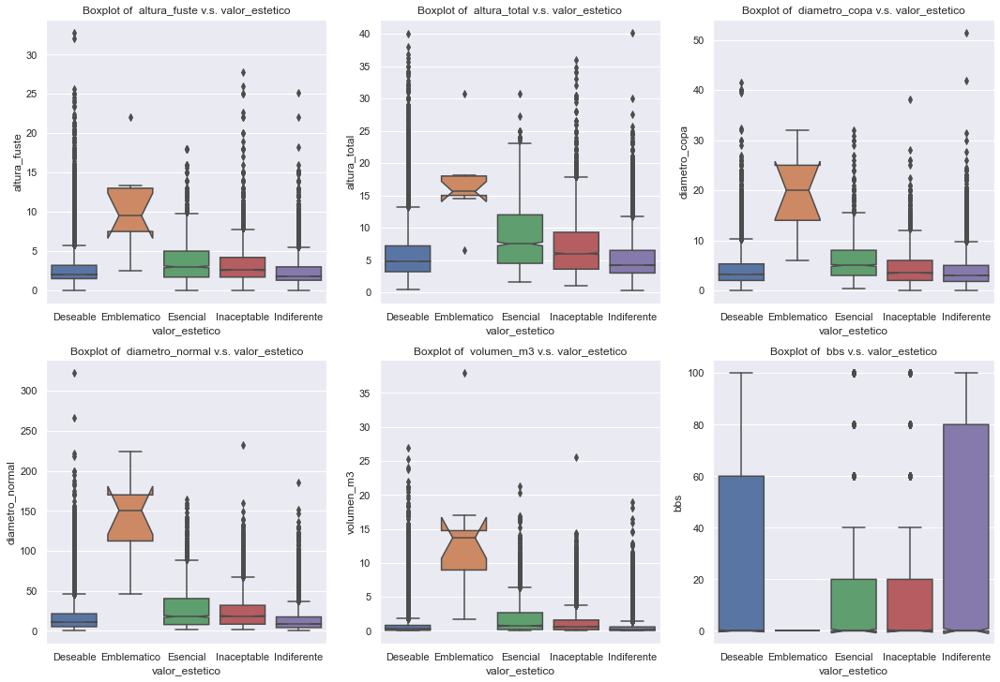

In [100]:
#  plot Numerical Data
a = len(var_num)  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(15,30))

for i in var_num:
    plt.subplot(a, b, c)
    plt.title('Boxplot of  {} v.s. {}'.format(i, var_cat[8]))
    plt.xlabel(i)
    sns.boxplot(y = df[i], x=df[var_cat[8]],notch ='True')
    c = c + 1
    
plt.tight_layout()
plt.show();

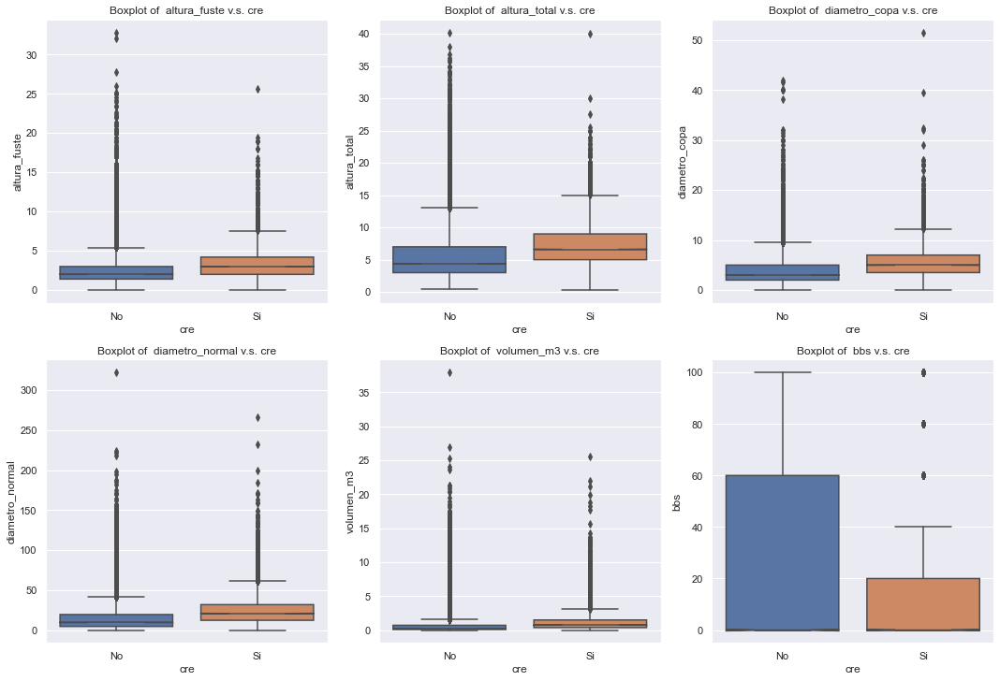

In [101]:
#  plot Numerical Data
a = len(var_num)  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(15,30))

for i in var_num:
    plt.subplot(a, b, c)
    plt.title('Boxplot of  {} v.s. {}'.format(i, var_cat[9]))
    plt.xlabel(i)
    sns.boxplot(y = df[i], x=df[var_cat[9]],notch ='True')
    c = c + 1
    
plt.tight_layout()
plt.show();

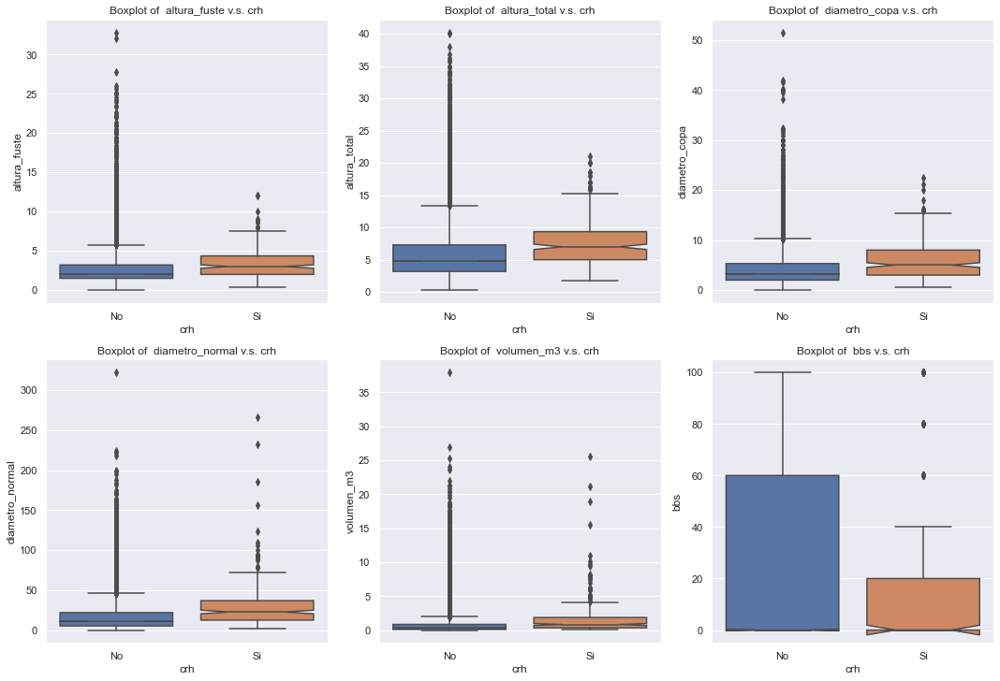

In [102]:
#  plot Numerical Data
a = len(var_num)  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(15,30))

for i in var_num:
    plt.subplot(a, b, c)
    plt.title('Boxplot of  {} v.s. {}'.format(i, var_cat[10]))
    plt.xlabel(i)
    sns.boxplot(y = df[i], x=df[var_cat[10]],notch ='True')
    c = c + 1
    
plt.tight_layout()
plt.show();

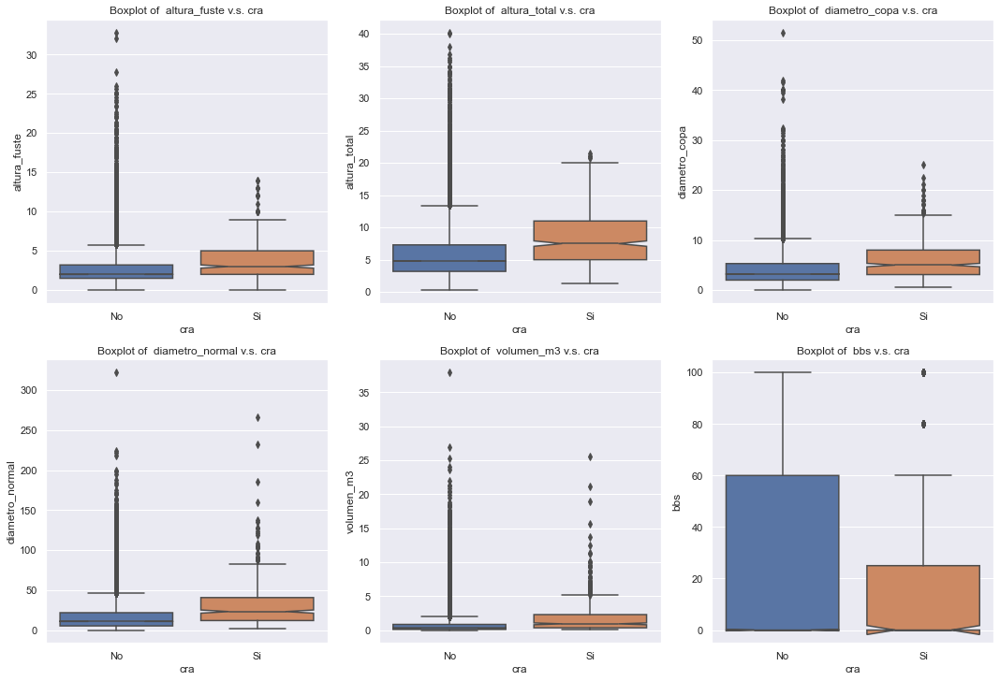

In [103]:
#  plot Numerical Data
a = len(var_num)  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(15,30))

for i in var_num:
    plt.subplot(a, b, c)
    plt.title('Boxplot of  {} v.s. {}'.format(i, var_cat[11]))
    plt.xlabel(i)
    sns.boxplot(y = df[i], x=df[var_cat[11]],notch ='True')
    c = c + 1
    
plt.tight_layout()
plt.show();

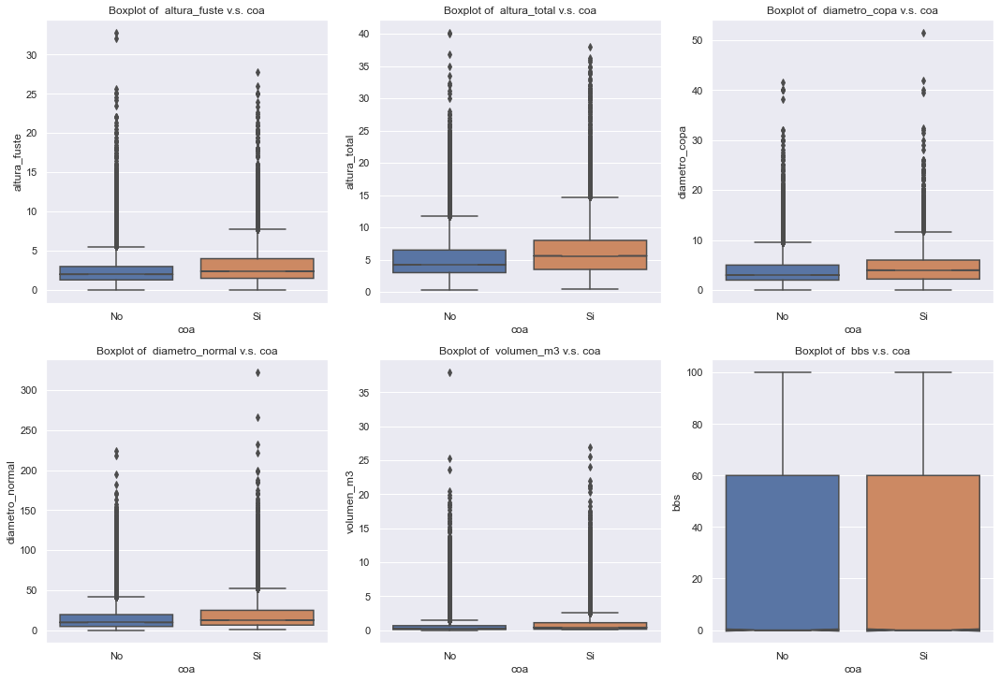

In [104]:
#  plot Numerical Data
a = len(var_num)  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(15,30))

for i in var_num:
    plt.subplot(a, b, c)
    plt.title('Boxplot of  {} v.s. {}'.format(i, var_cat[12]))
    plt.xlabel(i)
    sns.boxplot(y = df[i], x=df[var_cat[12]],notch ='True')
    c = c + 1
    
plt.tight_layout()
plt.show();

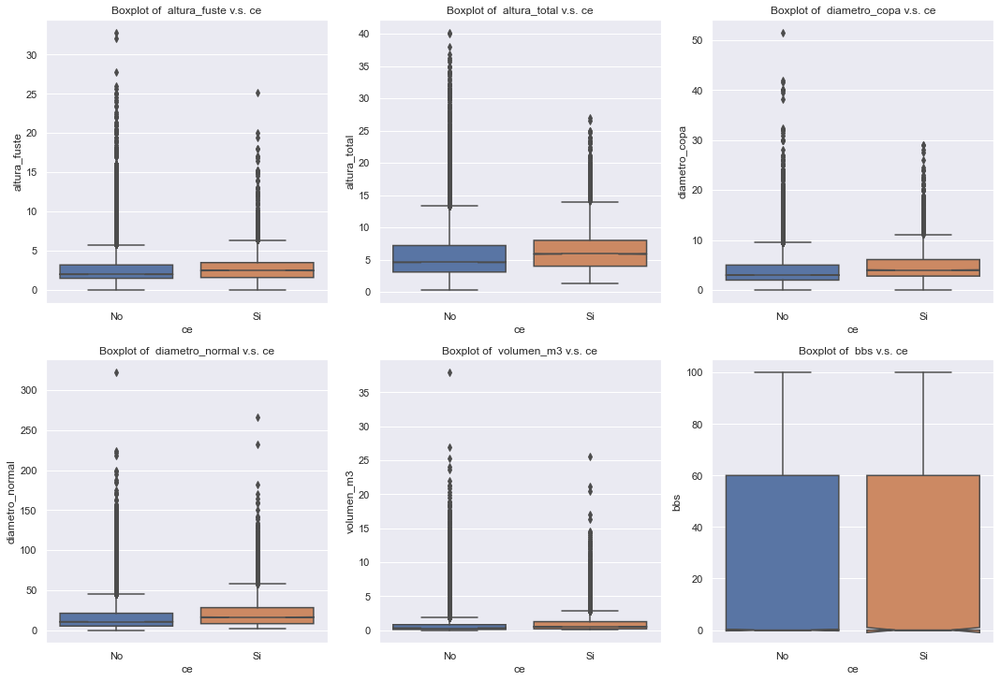

In [105]:
#  plot Numerical Data
a = len(var_num)  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(15,30))

for i in var_num:
    plt.subplot(a, b, c)
    plt.title('Boxplot of  {} v.s. {}'.format(i, var_cat[13]))
    plt.xlabel(i)
    sns.boxplot(y = df[i], x=df[var_cat[13]],notch ='True')
    c = c + 1
    
plt.tight_layout()
plt.show();

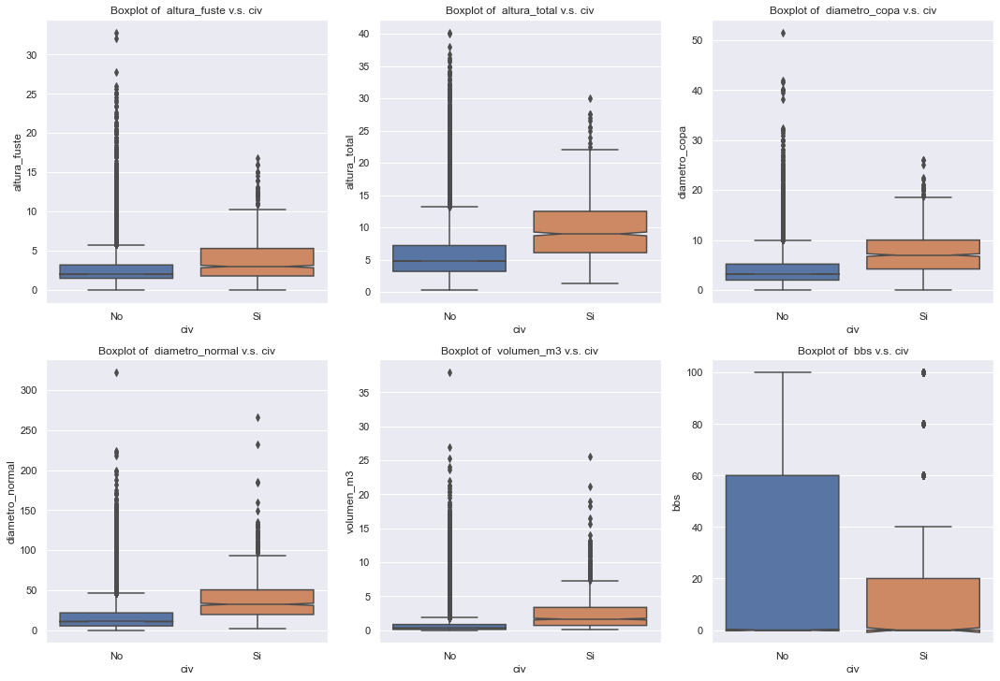

In [106]:
#  plot Numerical Data
a = len(var_num)  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(15,30))

for i in var_num:
    plt.subplot(a, b, c)
    plt.title('Boxplot of  {} v.s. {}'.format(i, var_cat[14]))
    plt.xlabel(i)
    sns.boxplot(y = df[i], x=df[var_cat[14]],notch ='True')
    c = c + 1
    
plt.tight_layout()
plt.show();

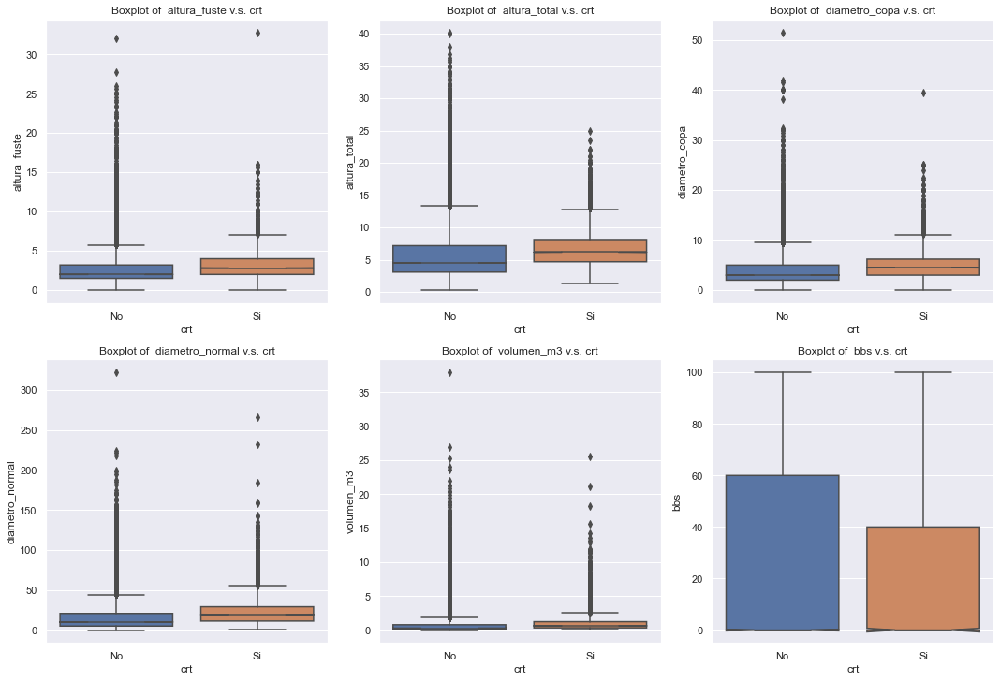

In [107]:
#  plot Numerical Data
a = len(var_num)  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(15,30))

for i in var_num:
    plt.subplot(a, b, c)
    plt.title('Boxplot of  {} v.s. {}'.format(i, var_cat[15]))
    plt.xlabel(i)
    sns.boxplot(y = df[i], x=df[var_cat[15]],notch ='True')
    c = c + 1
    
plt.tight_layout()
plt.show();

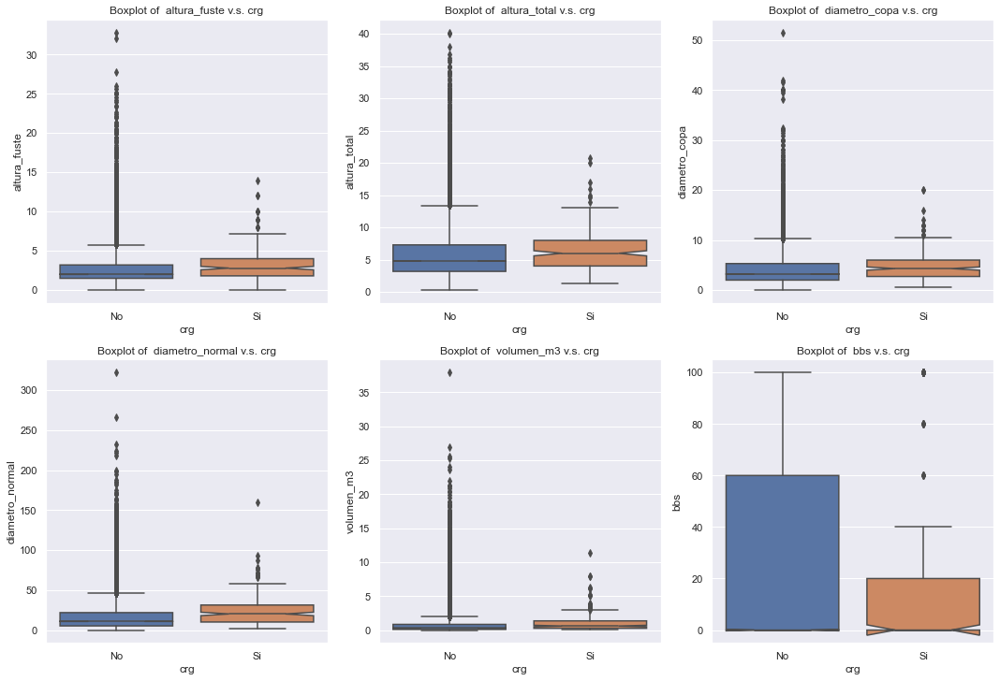

In [108]:
#  plot Numerical Data
a = len(var_num)  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(15,30))

for i in var_num:
    plt.subplot(a, b, c)
    plt.title('Boxplot of  {} v.s. {}'.format(i, var_cat[16]))
    plt.xlabel(i)
    sns.boxplot(y = df[i], x=df[var_cat[16]],notch ='True')
    c = c + 1
    
plt.tight_layout()
plt.show();

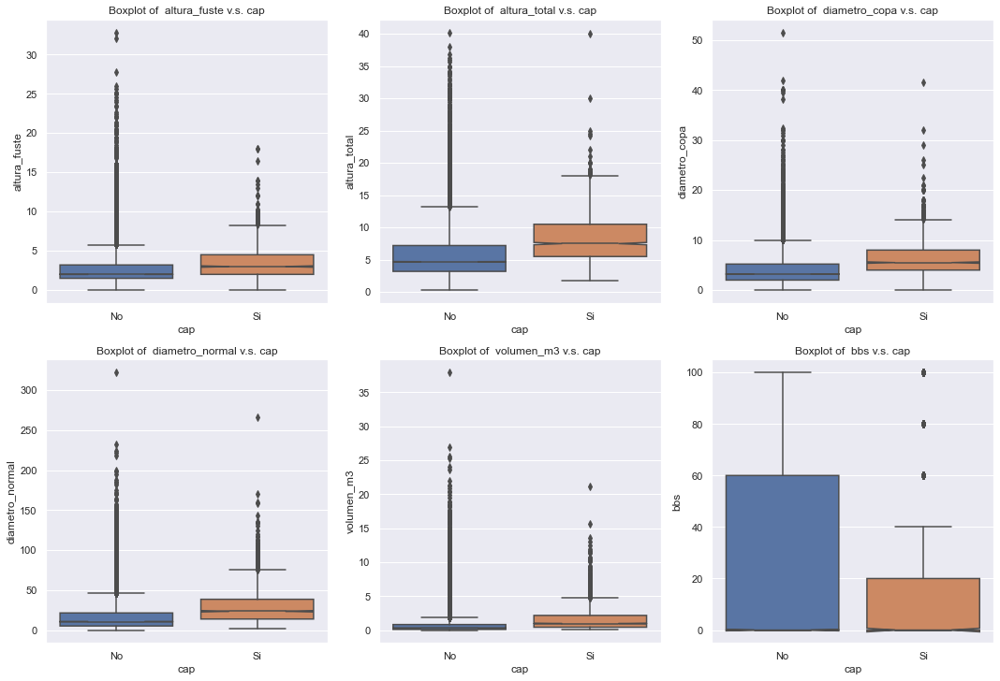

In [109]:
#  plot Numerical Data
a = len(var_num)  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(15,30))

for i in var_num:
    plt.subplot(a, b, c)
    plt.title('Boxplot of  {} v.s. {}'.format(i, var_cat[17]))
    plt.xlabel(i)
    sns.boxplot(y = df[i], x=df[var_cat[17]],notch ='True')
    c = c + 1
    
plt.tight_layout()
plt.show();

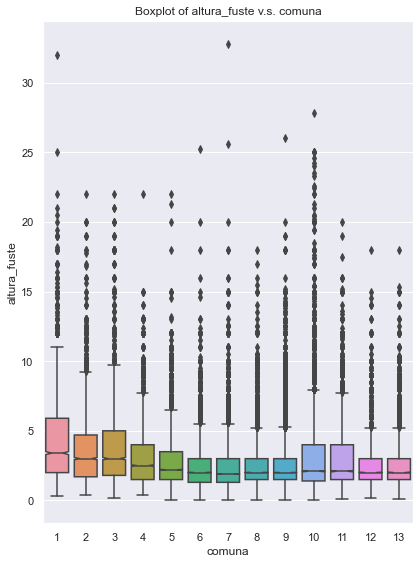

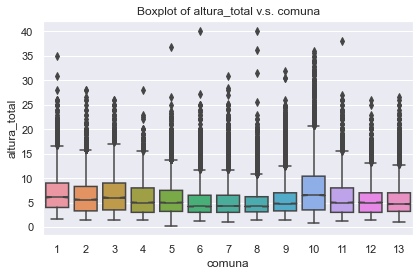

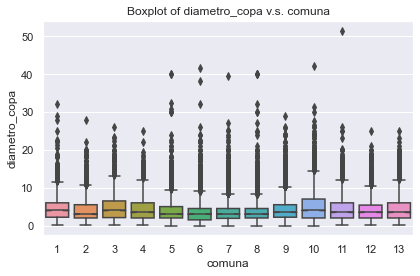

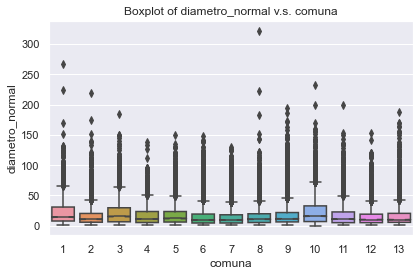

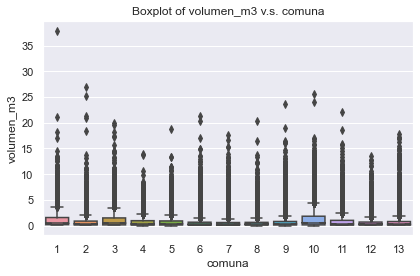

...

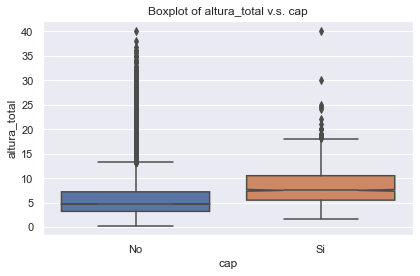

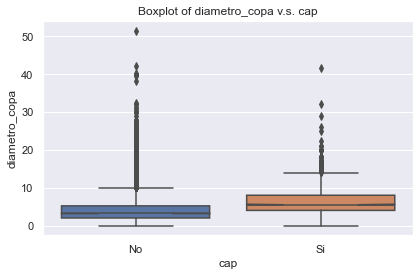

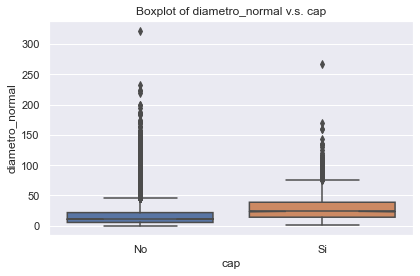

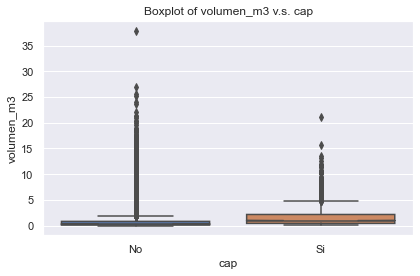

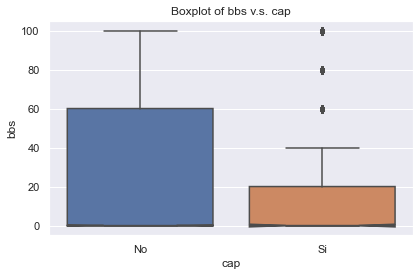

In [110]:
for j in var_cat:
    fig = plt.figure(figsize=(6,8))
    for i in var_num:
        plt.title('Boxplot of {} v.s. {}'.format(i,j))
        plt.xlabel(i)
        sns.boxplot(y = df[i], x=df[j],notch ='True')
        plt.tight_layout()
        plt.show();

#### Three variables with comuna

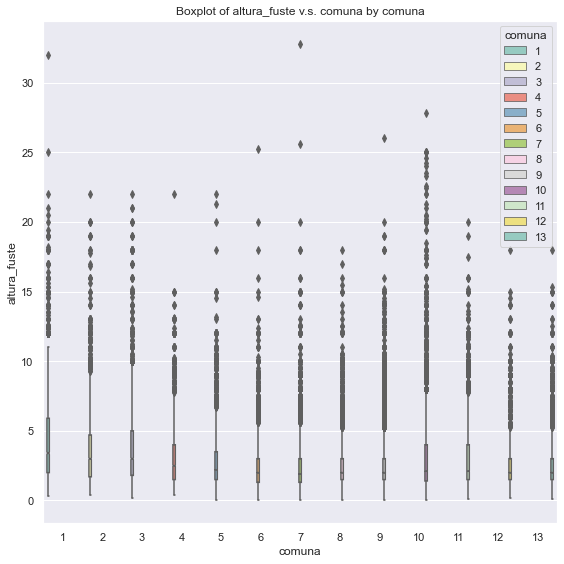

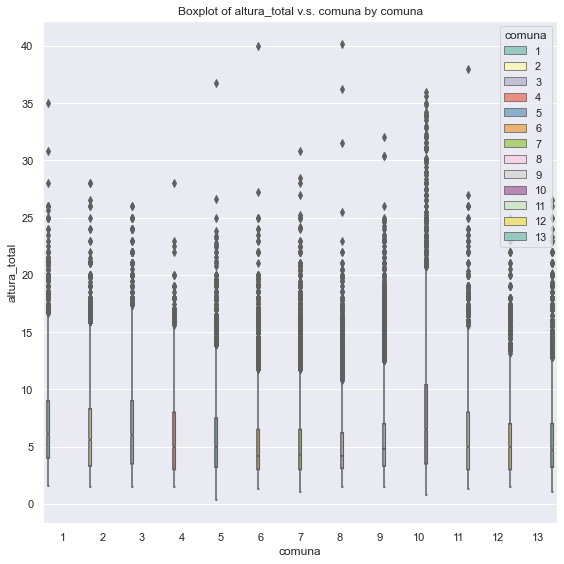

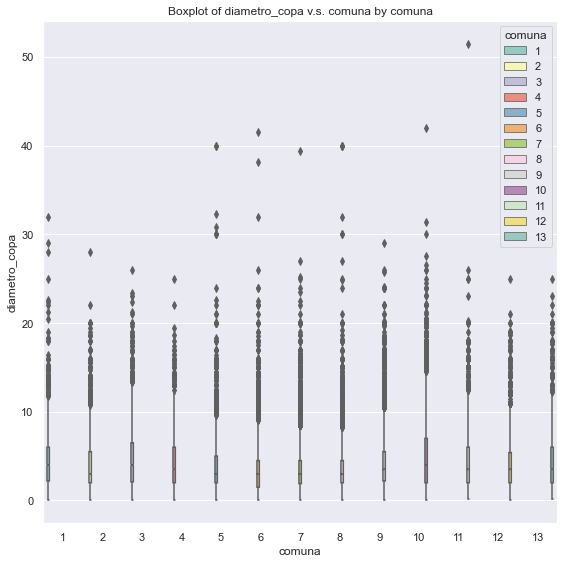

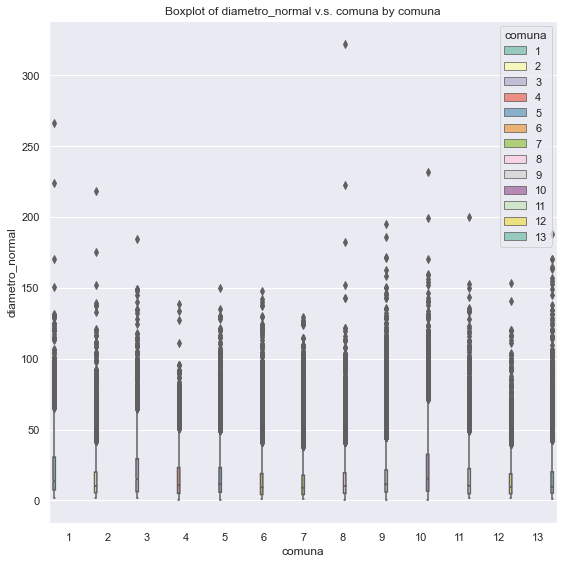

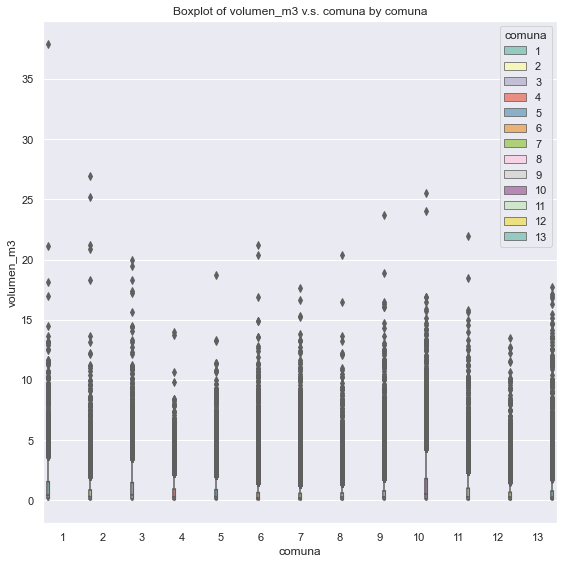

...

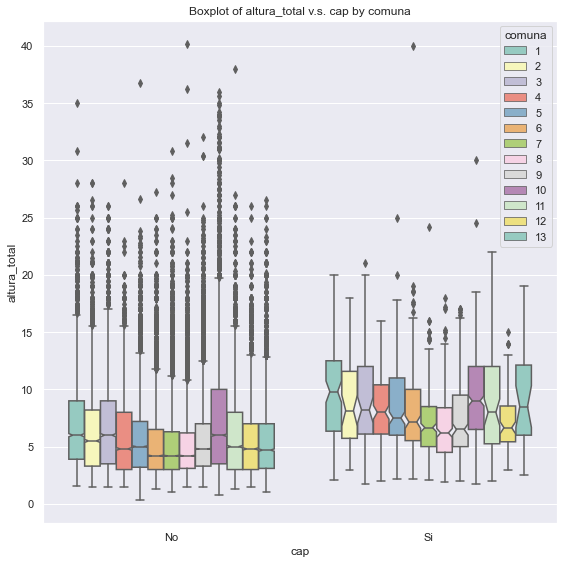

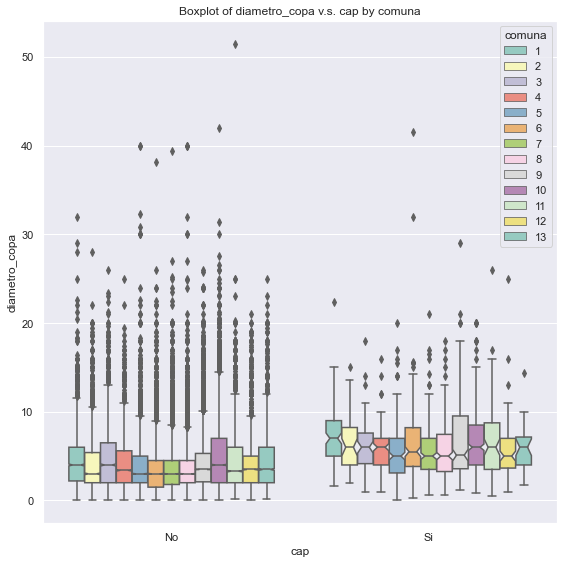

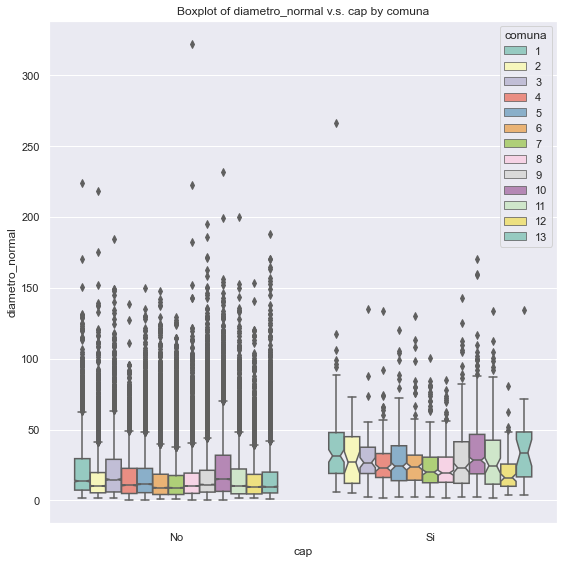

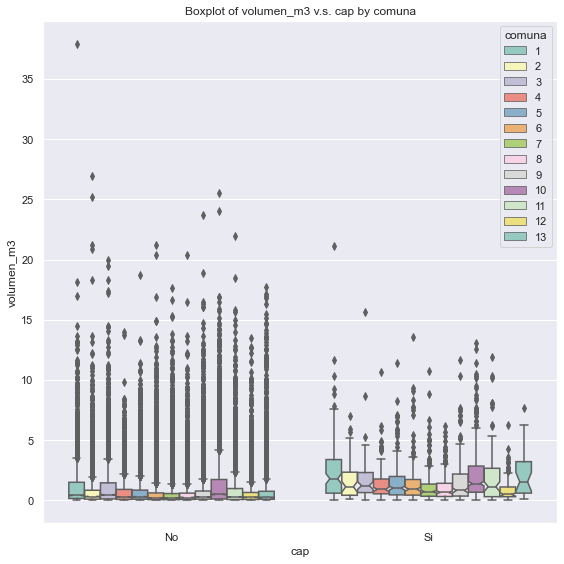

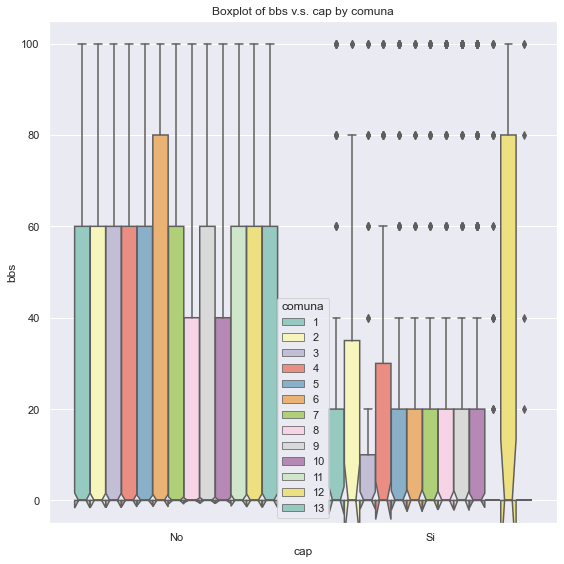

In [111]:
for j in var_cat:
    for i in var_num:
        fig = plt.figure(figsize=(8,8))
        plt.title('Boxplot of {} v.s. {} by comuna'.format(i,j))
        plt.xlabel(i)
        sns.boxplot(x=df[j], y=df[i], hue=df[var_cat[0]], palette="Set3",notch ='True')
        plt.tight_layout()
        plt.show();

### Histogram Analysis

In [112]:
df["comuna"].unique()

[7, 9, 8, 6, 5, ..., 11, 1, 2, 12, 13]
Length: 13
Categories (13, int64): [7, 9, 8, 6, ..., 1, 2, 12, 13]

array([[<AxesSubplot:title={'center':'OBJECTID'}>,
        <AxesSubplot:title={'center':'OBJECTID_1'}>,
        <AxesSubplot:title={'center':'fecha'}>,
        <AxesSubplot:title={'center':'altura_fuste'}>,
        <AxesSubplot:title={'center':'altura_total'}>],
       [<AxesSubplot:title={'center':'diametro_copa'}>,
        <AxesSubplot:title={'center':'diametro_normal'}>,
        <AxesSubplot:title={'center':'volumen_m3'}>,
        <AxesSubplot:title={'center':'inc'}>,
        <AxesSubplot:title={'center':'rd'}>],
       [<AxesSubplot:title={'center':'dm'}>,
        <AxesSubplot:title={'center':'bbs'}>,
        <AxesSubplot:title={'center':'abs'}>,
        <AxesSubplot:title={'center':'pi'}>,
        <AxesSubplot:title={'center':'ph'}>],
       [<AxesSubplot:title={'center':'pa'}>,
        <AxesSubplot:title={'center':'pd'}>,
        <AxesSubplot:title={'center':'pe'}>,
        <AxesSubplot:title={'center':'pp'}>,
        <AxesSubplot:title={'center':'po'}>],
       [<AxesSubplot:tit

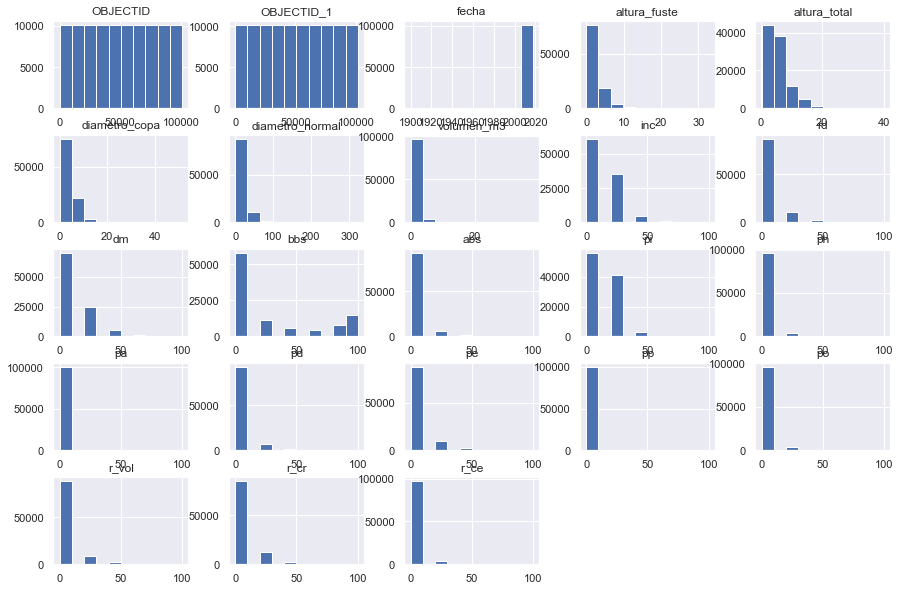

In [113]:
df.hist(figsize=(15,10))

In [114]:
print(df.describe())

            OBJECTID     OBJECTID_1   altura_fuste   altura_total  \
count  101285.000000  101285.000000  101285.000000  101285.000000   
mean    50644.295286   50768.513304       2.715306       5.844057   
std     29239.872344   29344.036225       2.129491       3.674017   
min         1.000000       1.000000       0.000000       0.300000   
25%     25322.000000   25357.000000       1.500000       3.200000   
50%     50644.000000   50732.000000       2.000000       4.800000   
75%     75967.000000   76184.000000       3.200000       7.300000   
max    101289.000000  101652.000000      32.800000      40.200000   

       diametro_copa  diametro_normal     volumen_m3            inc  \
count  101285.000000    101285.000000  101285.000000  101285.000000   
mean        4.085422        16.560477       0.799472       9.281532   
std         2.996645        17.082468       1.422671      12.709994   
min         0.000000         0.000000       0.000000       0.000000   
25%         2.000000   

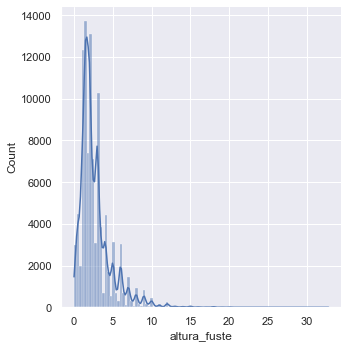

In [117]:
sns.displot(data=df, x="altura_fuste",bins=100, kde=True)

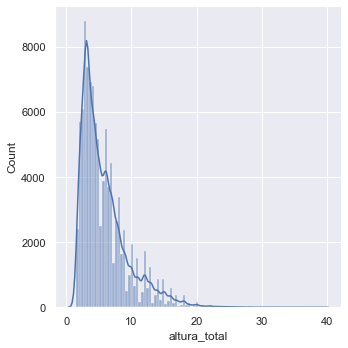

In [118]:
sns.displot(data=df, x="altura_total",bins=100, kde=True)

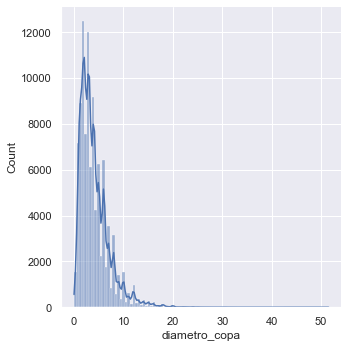

In [119]:
sns.displot(data=df, x="diametro_copa",bins=100, kde=True)

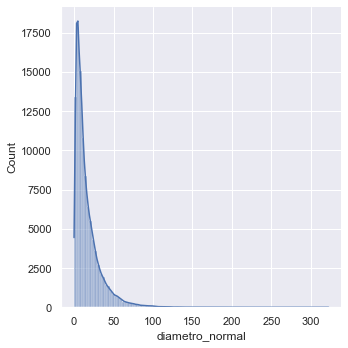

In [120]:
sns.displot(data=df, x="diametro_normal",bins=100, kde=True)

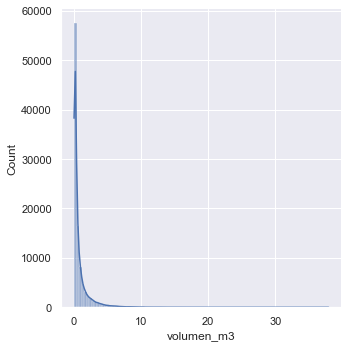

In [121]:
sns.displot(data=df, x="volumen_m3",bins=100, kde=True)

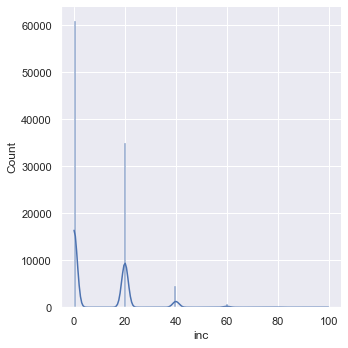

In [122]:
sns.displot(data=df, x="inc", kde=True)

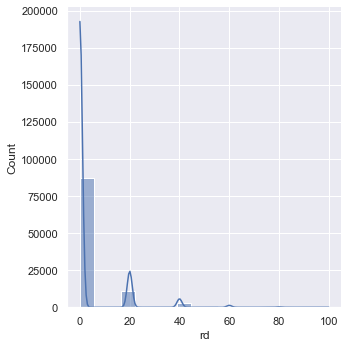

In [123]:
sns.displot(data=df, x="rd", kde=True)

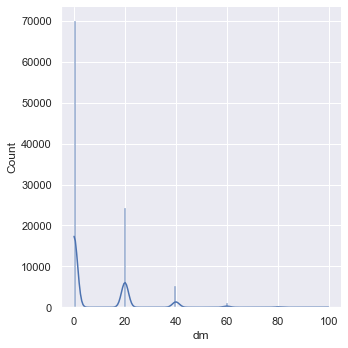

In [124]:
sns.displot(data=df, x="dm", kde=True)

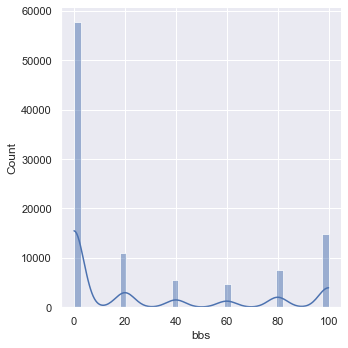

In [125]:
sns.displot(data=df, x="bbs", kde=True)

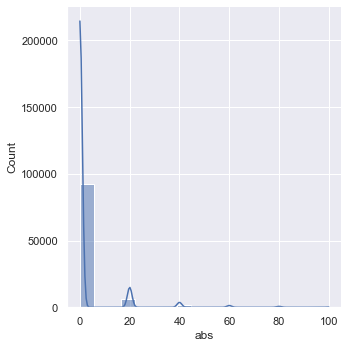

In [126]:
sns.displot(data=df, x="abs", kde=True)

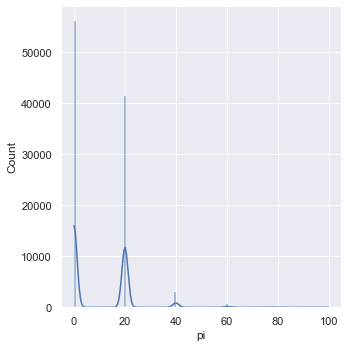

In [127]:
sns.displot(data=df, x="pi", kde=True)

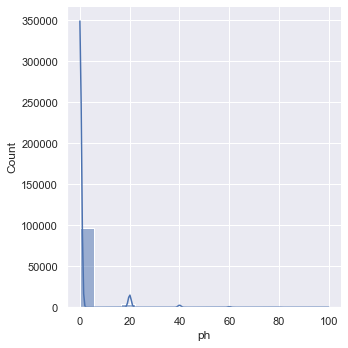

In [128]:
sns.displot(data=df, x="ph", kde=True)

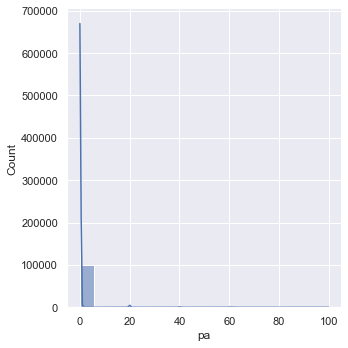

In [129]:
sns.displot(data=df, x="pa", kde=True)

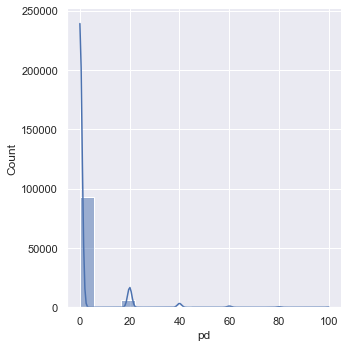

In [130]:
sns.displot(data=df, x="pd", kde=True)

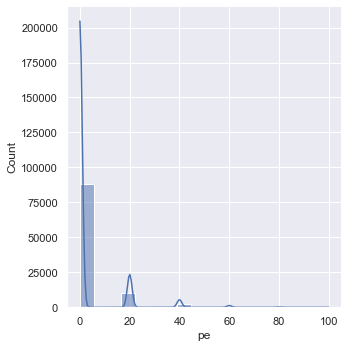

In [131]:
sns.displot(data=df, x="pe", kde=True)

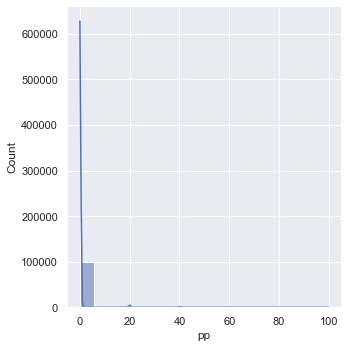

In [132]:
sns.displot(data=df, x="pp", kde=True)

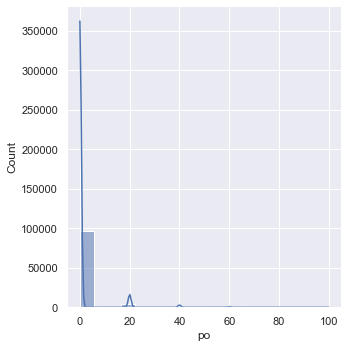

In [133]:
sns.displot(data=df, x="po", kde=True)

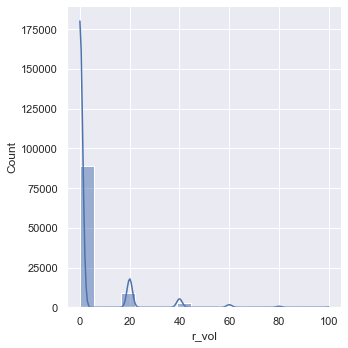

In [134]:
sns.displot(data=df, x="r_vol", kde=True)

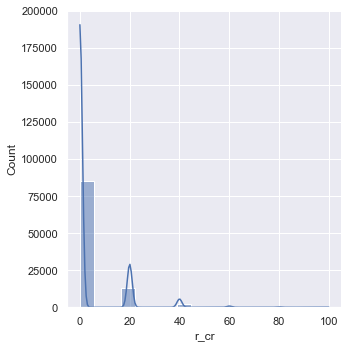

In [135]:
sns.displot(data=df, x="r_cr", kde=True)

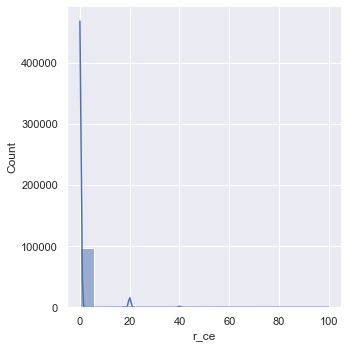

In [136]:
sns.displot(data=df, x="r_ce", kde=True)

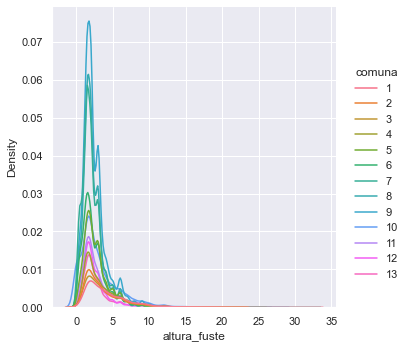

In [137]:
sns.displot(data=df, x="altura_fuste", hue="comuna", kind="kde")

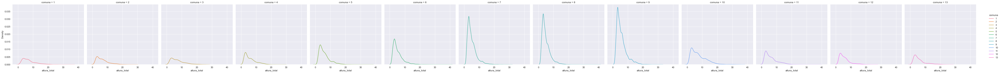

In [138]:
sns.displot(data=df, x="altura_total", hue="comuna", col="comuna", kind="kde")

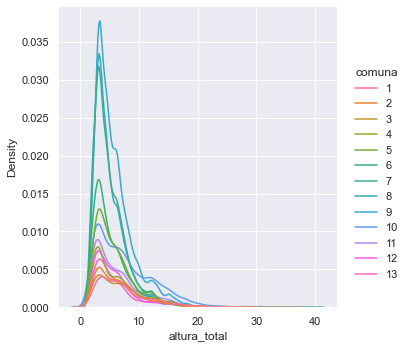

In [139]:
sns.displot(data=df, x="altura_total", hue="comuna", kind="kde")

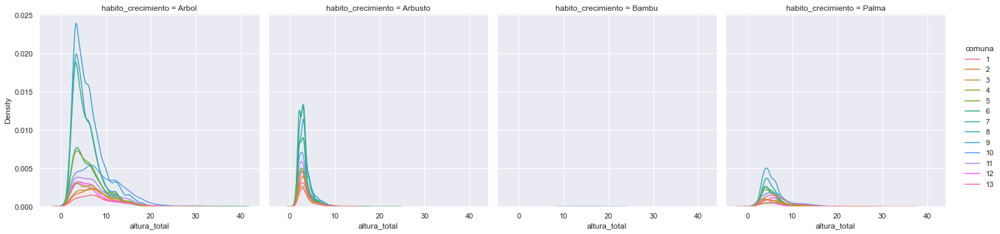

In [140]:
sns.displot(data=df, x="altura_total", hue="comuna", col="habito_crecimiento", kind="kde")

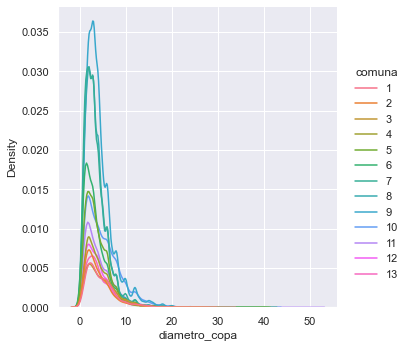

In [141]:
sns.displot(data=df, x="diametro_copa", hue="comuna", kind="kde")

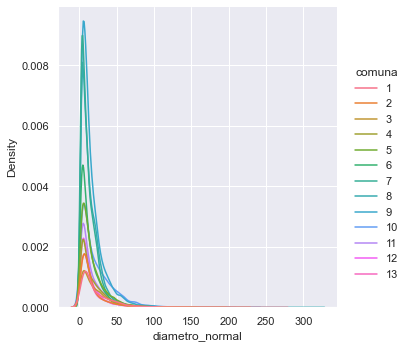

In [142]:
sns.displot(data=df, x="diametro_normal", hue="comuna", kind="kde")

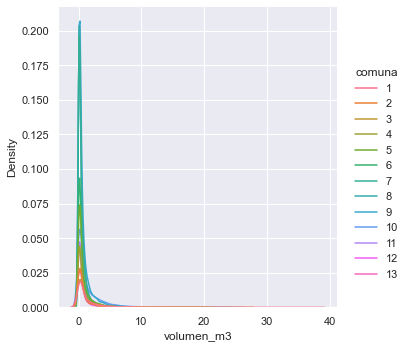

In [143]:
sns.displot(data=df, x="volumen_m3", hue="comuna", kind="kde")

Text(0.5, 0, 'altura_fuste')

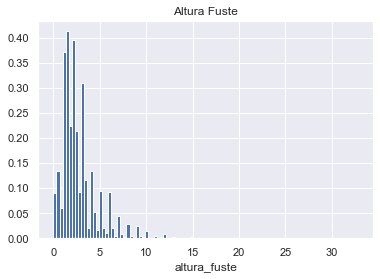

In [144]:
df.altura_fuste.hist(bins=100, density=True)
plt.title("Altura Fuste")
plt.xlabel("altura_fuste")

Text(0.5, 0, 'comuna')

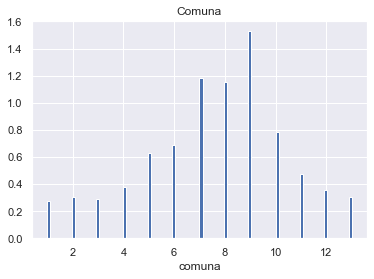

In [145]:
df.comuna.hist(bins=100, density=True)
plt.title("Comuna")
plt.xlabel("comuna")

Text(0.5, 0, 'altura_total')

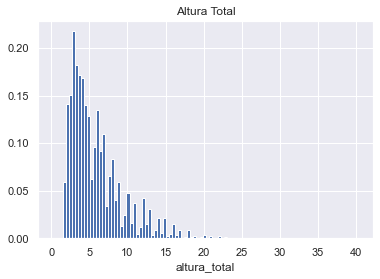

In [146]:
df.altura_total.hist(bins=100, density=True)
plt.title("Altura Total")
plt.xlabel("altura_total")

Text(0.5, 0, 'diametro_copa')

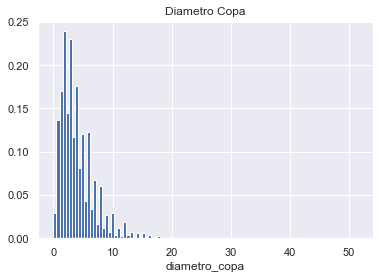

In [147]:
df.diametro_copa.hist(bins=100, density=True)
plt.title("Diametro Copa")
plt.xlabel("diametro_copa")

Text(0.5, 0, 'diametro_normal')

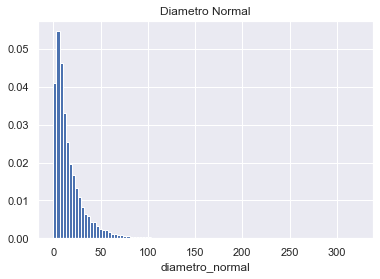

In [148]:
df.diametro_normal.hist(bins=100, density=True)
plt.title("Diametro Normal")
plt.xlabel("diametro_normal")

Text(0.5, 0, 'volumen_m3')

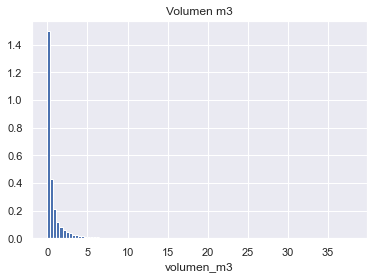

In [149]:
df.volumen_m3.hist(bins=100, density=True)
plt.title("Volumen m3")
plt.xlabel("volumen_m3")

Text(0.5, 0, 'inc')

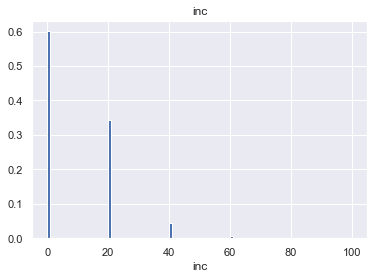

In [150]:
df.inc.hist(bins=100, density=True)
plt.title("inc")
plt.xlabel("inc")

Text(0.5, 0, 'rd')

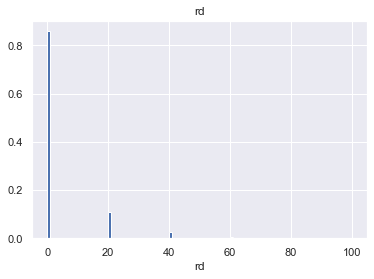

In [151]:
df.rd.hist(bins=100, density=True)
plt.title("rd")
plt.xlabel("rd")

Text(0.5, 0, 'dm')

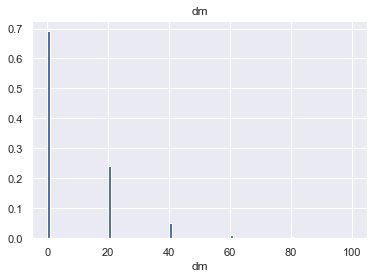

In [152]:
df.dm.hist(bins=100, density=True)
plt.title("dm")
plt.xlabel("dm")

Text(0.5, 0, 'bbs')

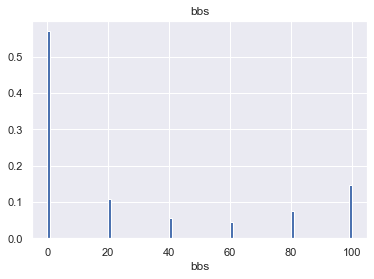

In [153]:
df.bbs.hist(bins=100, density=True)
plt.title("bbs")
plt.xlabel("bbs")

Text(0.5, 0, 'abs')

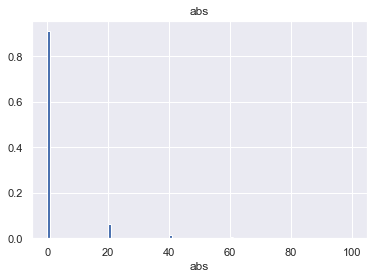

In [154]:
df["abs"].hist(bins=100, density=True)
plt.title("abs")
plt.xlabel("abs")

Text(0.5, 0, 'pi')

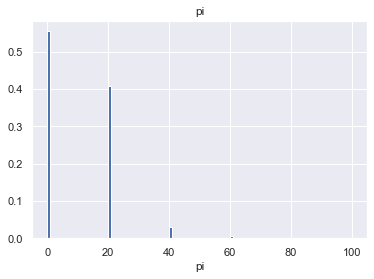

In [155]:
df["pi"].hist(bins=100, density=True)
plt.title("pi")
plt.xlabel("pi")

Text(0.5, 0, 'ph')

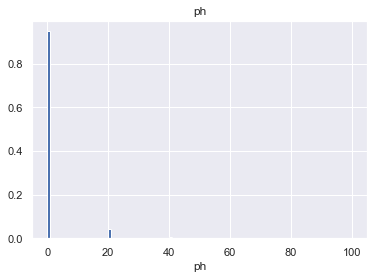

In [156]:
df.ph.hist(bins=100, density=True)
plt.title("ph")
plt.xlabel("ph")

Text(0.5, 0, 'pa')

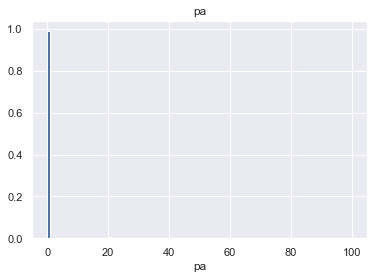

In [157]:
df.pa.hist(bins=100, density=True)
plt.title("pa")
plt.xlabel("pa")

Text(0.5, 0, 'pd')

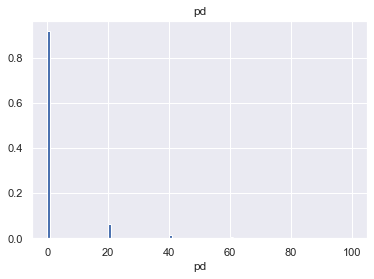

In [158]:
df.pd.hist(bins=100, density=True)
plt.title("pd")
plt.xlabel("pd")

Text(0.5, 0, 'pe')

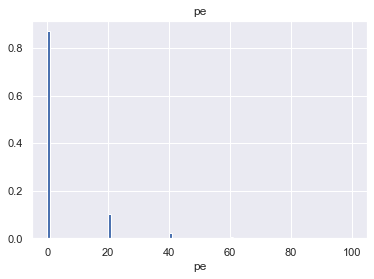

In [159]:
df.pe.hist(bins=100, density=True)
plt.title("pe")
plt.xlabel("pe")

Text(0.5, 0, 'pp')

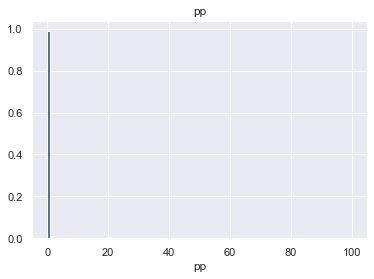

In [160]:
df.pp.hist(bins=100, density=True)
plt.title("pp")
plt.xlabel("pp")

Text(0.5, 0, 'po')

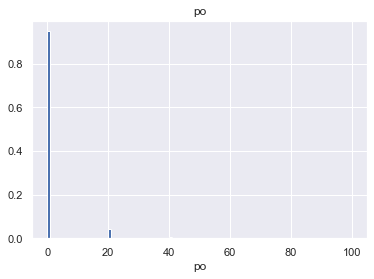

In [161]:
df.po.hist(bins=100, density=True)
plt.title("po")
plt.xlabel("po")

Text(0.5, 0, 'r_vol')

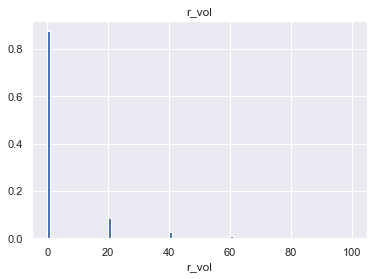

In [162]:
df.r_vol.hist(bins=100, density=True)
plt.title("r_vol")
plt.xlabel("r_vol")

Text(0.5, 0, 'r_cr')

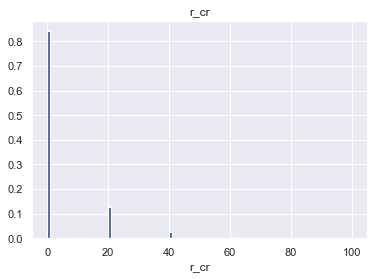

In [163]:
df.r_cr.hist(bins=100, density=True)
plt.title("r_cr")
plt.xlabel("r_cr")

Text(0.5, 0, 'r_ce')

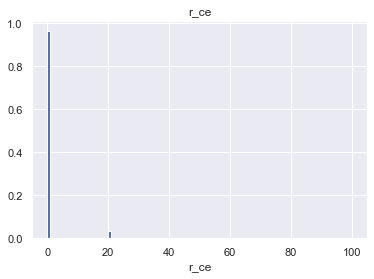

In [164]:
df.r_ce.hist(bins=100, density=True)
plt.title("r_ce")
plt.xlabel("r_ce")

<AxesSubplot:xlabel='altura_fuste', ylabel='Count'>

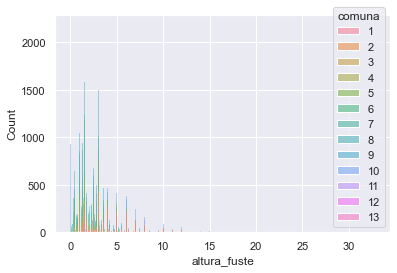

In [165]:
sns.histplot(data=df, x="altura_fuste", hue="comuna")

In [166]:
df.altura_fuste.sort_values(ascending=False).unique()

array([32.8 , 32.  , 27.8 , 26.  , 25.6 , 25.2 , 25.  , 24.6 , 24.2 ,
       24.  , 23.5 , 23.3 , 22.6 , 22.4 , 22.  , 21.3 , 21.  , 20.5 ,
       20.4 , 20.2 , 20.  , 19.4 , 19.  , 18.5 , 18.2 , 18.  , 17.8 ,
       17.6 , 17.5 , 17.4 , 17.  , 16.8 , 16.4 , 16.  , 15.6 , 15.5 ,
       15.4 , 15.3 , 15.2 , 15.  , 14.9 , 14.8 , 14.6 , 14.5 , 14.3 ,
       14.2 , 14.  , 13.8 , 13.6 , 13.5 , 13.4 , 13.3 , 13.2 , 13.1 ,
       13.  , 12.8 , 12.6 , 12.59, 12.56, 12.5 , 12.4 , 12.3 , 12.2 ,
       12.1 , 12.  , 11.8 , 11.7 , 11.6 , 11.5 , 11.4 , 11.3 , 11.2 ,
       11.1 , 11.  , 10.9 , 10.8 , 10.6 , 10.5 , 10.4 , 10.3 , 10.2 ,
       10.1 , 10.  ,  9.9 ,  9.8 ,  9.7 ,  9.6 ,  9.59,  9.58,  9.5 ,
        9.44,  9.4 ,  9.3 ,  9.2 ,  9.1 ,  9.  ,  8.9 ,  8.84,  8.8 ,
        8.7 ,  8.69,  8.6 ,  8.59,  8.5 ,  8.4 ,  8.3 ,  8.25,  8.2 ,
        8.1 ,  8.  ,  7.96,  7.9 ,  7.8 ,  7.7 ,  7.6 ,  7.58,  7.51,
        7.5 ,  7.4 ,  7.36,  7.31,  7.3 ,  7.25,  7.23,  7.2 ,  7.11,
        7.1 ,  7.  ,

In [167]:
df1=df[df['altura_fuste']<=1.5]
df1=df1.comuna.value_counts()

df1

9     5869
7     5676
8     4664
10    3163
6     3156
5     2183
11    1647
12    1291
4     1197
13    1051
2      780
3      672
1      463
Name: comuna, dtype: int64

<AxesSubplot:title={'center':'comunas with altura_fuste <= 1.5'}, xlabel='comuna', ylabel='count'>

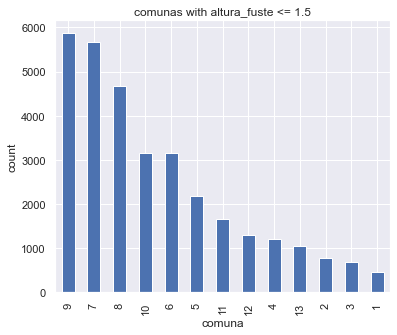

In [168]:
df1.plot(kind='bar', title='comunas with altura_fuste <= 1.5', ylabel='count',
         xlabel='comuna', figsize=(6, 5))

In [169]:
df2=df
df2=df2.altura_fuste.value_counts()

df2

2.00     10227
3.00      8376
1.50      7970
1.00      5750
1.30      4395
         ...  
1.76         1
8.59         1
4.13         1
17.80        1
5.53         1
Name: altura_fuste, Length: 468, dtype: int64

In [170]:
df1=df[(df['altura_fuste']>1.5 )]
df1=df1[(df1['altura_fuste']<3)]
df1=df1.comuna.value_counts()

df1

9     6963
8     5696
7     5071
6     2683
5     2527
10    2512
11    1822
12    1608
13    1431
4     1347
2     1017
3      912
1      881
Name: comuna, dtype: int64

<AxesSubplot:title={'center':'comunas with altura_fuste > 1.5 and < 3'}, xlabel='comuna', ylabel='count'>

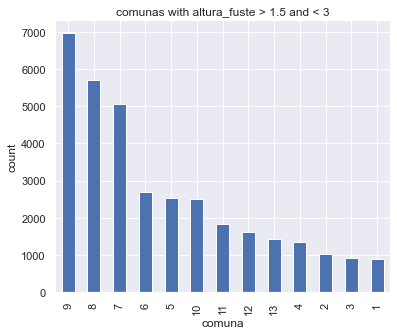

In [171]:
df1.plot(kind='bar', title='comunas with altura_fuste > 1.5 and < 3', ylabel='count',
         xlabel='comuna', figsize=(6, 5))

In [172]:
df1=df[(df['altura_fuste']>=3 )]
df1=df1[(df1['altura_fuste']<5)]
df1=df1.comuna.value_counts()

df1


9     3986
8     2687
7     2572
10    1915
5     1822
6     1718
11    1185
4     1093
2      976
12     974
3      945
1      897
13     748
Name: comuna, dtype: int64

<AxesSubplot:title={'center':'comunas with altura_fuste >= 3 and < 5'}, xlabel='comuna', ylabel='count'>

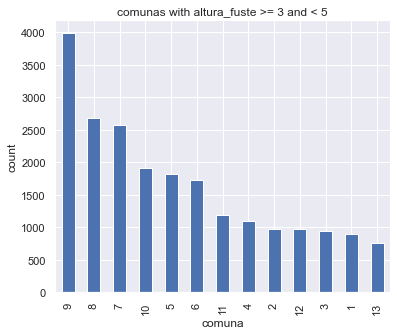

In [173]:
df1.plot(kind='bar', title='comunas with altura_fuste >= 3 and < 5', ylabel='count',
         xlabel='comuna', figsize=(6, 5))

In [174]:
df1=df[df['altura_fuste']>=5]
df1=df1.comuna.value_counts()

df1

10    1969
9     1752
11    1093
1     1078
5     1078
7     1017
3      990
8      960
4      945
2      903
6      793
13     469
12     438
Name: comuna, dtype: int64

<AxesSubplot:title={'center':'comunas with altura_fuste >= 5'}, xlabel='comuna', ylabel='comuna'>

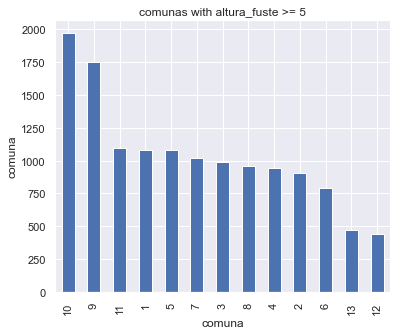

In [175]:
df1.plot(kind='bar', title='comunas with altura_fuste >= 5', ylabel='comuna',
         xlabel='comuna', figsize=(6, 5))

In [176]:
df1=df[df['altura_total']<=1.5]
df1=df1.comuna.value_counts()

df1

6     51
10    40
7     38
8     31
5     30
11    18
9     15
12     7
2      5
13     5
4      4
3      2
1      0
Name: comuna, dtype: int64

<AxesSubplot:title={'center':'comunas with altura_total <= 1.5'}, xlabel='comuna', ylabel='count'>

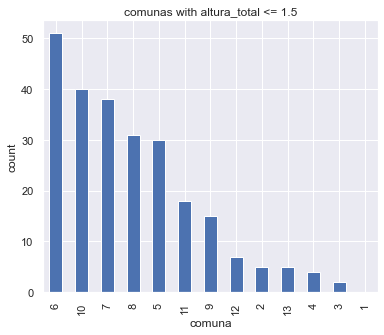

In [177]:
df1.plot(kind='bar', title='comunas with altura_total <= 1.5', ylabel='count',
         xlabel='comuna', figsize=(6, 5))

In [178]:
df1=df[(df['altura_total']>1.5 )]
df1=df1[(df1['altura_total']<3)]
df1=df1.comuna.value_counts()

df1

7     3070
8     2760
9     2558
6     1825
10    1436
5     1271
11    1134
4      935
12     837
13     650
2      548
3      520
1      362
Name: comuna, dtype: int64

<AxesSubplot:title={'center':'comunas with altura_total > 1.5 and < 3'}, xlabel='comuna', ylabel='count'>

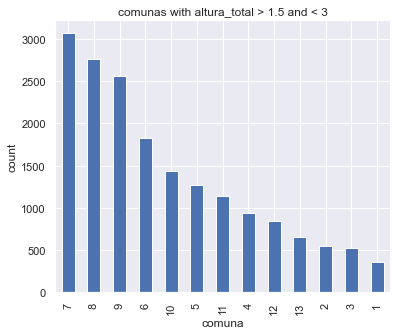

In [179]:
df1.plot(kind='bar', title='comunas with altura_total > 1.5 and < 3', ylabel='count',
         xlabel='comuna', figsize=(6, 5))

In [180]:
df1=df[(df['altura_total']>=3 )]
df1=df1[(df1['altura_total']<5)]
df1=df1.comuna.value_counts()

df1

9     6924
8     5652
7     5325
6     2882
5     2387
10    1934
11    1498
4     1313
12    1300
13    1232
2     1006
1      833
3      827
Name: comuna, dtype: int64

<AxesSubplot:title={'center':'comunas with altura_total >= 3 and < 5'}, xlabel='comuna', ylabel='count'>

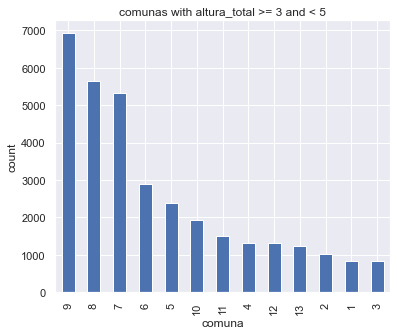

In [181]:
df1.plot(kind='bar', title='comunas with altura_total >= 3 and < 5', ylabel='count',
         xlabel='comuna', figsize=(6, 5))

In [182]:
df1=df[df['altura_total']>=5]
df1=df1.comuna.value_counts()

df1

9     9073
10    6149
7     5903
8     5564
5     3922
6     3592
11    3097
4     2330
3     2170
12    2167
1     2124
2     2117
13    1812
Name: comuna, dtype: int64

<AxesSubplot:title={'center':'comunas with altura_total >= 5'}, xlabel='comuna', ylabel='count'>

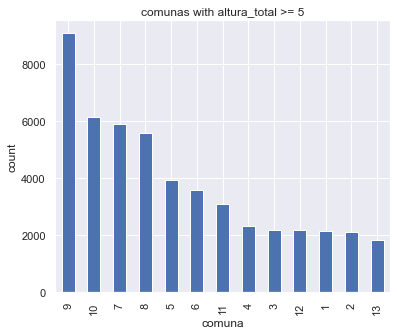

In [183]:
df1.plot(kind='bar', title='comunas with altura_total >= 5', ylabel='count',
         xlabel='comuna', figsize=(6, 5))

<AxesSubplot:title={'center':'comunas with diametro_copa <= 2'}, xlabel='comuna', ylabel='count'>

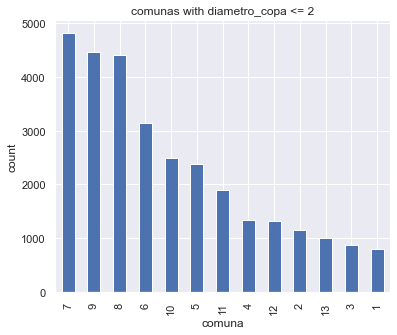

In [184]:
df1=df[df['diametro_copa']<=2]
df1=df1.comuna.value_counts()

df1.plot(kind='bar', title='comunas with diametro_copa <= 2', ylabel='count',
         xlabel='comuna', figsize=(6, 5))

<AxesSubplot:title={'center':'comunas with diametro_copa > 2 and < 5'}, xlabel='comuna', ylabel='count'>

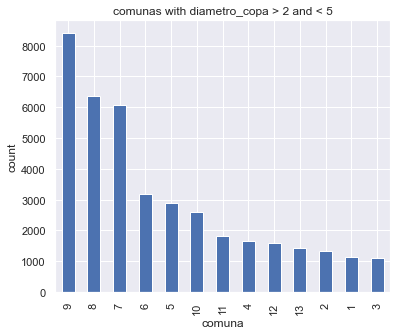

In [185]:
df1=df[(df['diametro_copa']>2 )]
df1=df1[(df1['diametro_copa']<5)]
df1=df1.comuna.value_counts()

df1.plot(kind='bar', title='comunas with diametro_copa > 2 and < 5', ylabel='count',
         xlabel='comuna', figsize=(6, 5))

<AxesSubplot:title={'center':'comunas with diametro_copa >= 5 and < 10'}, xlabel='comuna', ylabel='count'>

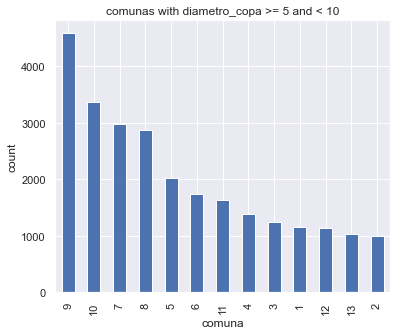

In [186]:
df1=df[(df['diametro_copa']>=5 )]
df1=df1[(df1['diametro_copa']<10)]
df1=df1.comuna.value_counts()

df1.plot(kind='bar', title='comunas with diametro_copa >= 5 and < 10', ylabel='count',
         xlabel='comuna', figsize=(6, 5))

<AxesSubplot:title={'center':'comunas with diametro_copa >= 10'}, xlabel='comuna', ylabel='count'>

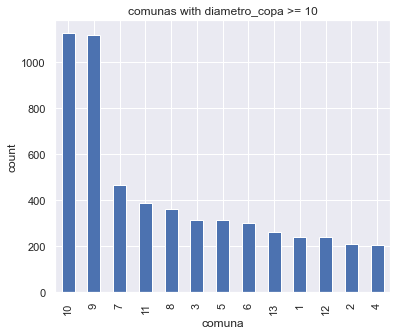

In [187]:
df1=df[df['diametro_copa']>=10]
df1=df1.comuna.value_counts()

df1.plot(kind='bar', title='comunas with diametro_copa >= 10', ylabel='count',
         xlabel='comuna', figsize=(6, 5))

<AxesSubplot:title={'center':'comunas with diametro_normal <= 0.5'}, xlabel='comuna', ylabel='count'>

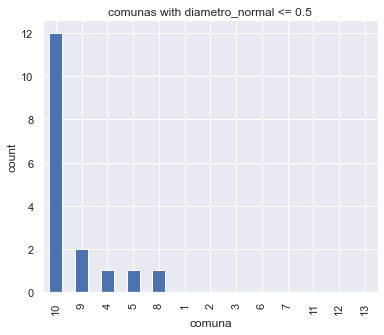

In [188]:
df1=df[df['diametro_normal']<=0.5]
df1=df1.comuna.value_counts()

df1.plot(kind='bar', title='comunas with diametro_normal <= 0.5', ylabel='count',
         xlabel='comuna', figsize=(6, 5))

<AxesSubplot:title={'center':'comunas with diametro_normal > 0.5 and < 1'}, xlabel='comuna', ylabel='count'>

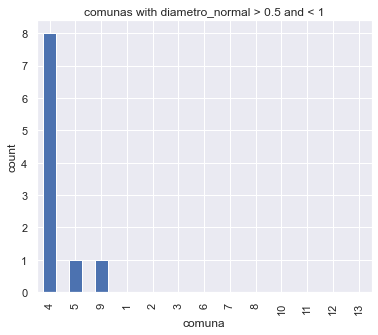

In [189]:
df1=df[(df['diametro_normal']>0.5 )]
df1=df1[(df1['diametro_normal']<1)]
df1=df1.comuna.value_counts()

df1.plot(kind='bar', title='comunas with diametro_normal > 0.5 and < 1', ylabel='count',
         xlabel='comuna', figsize=(6, 5))

<AxesSubplot:title={'center':'comunas with diametro_normal >= 1 and < 3'}, xlabel='comuna', ylabel='count'>

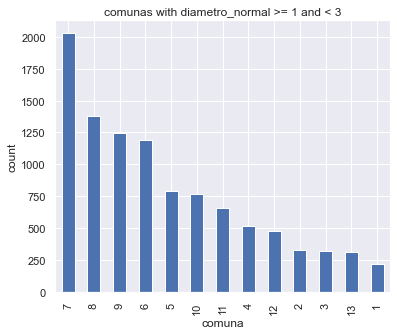

In [190]:
df1=df[(df['diametro_normal']>=1 )]
df1=df1[(df1['diametro_normal']<3)]
df1=df1.comuna.value_counts()

df1.plot(kind='bar', title='comunas with diametro_normal >= 1 and < 3', ylabel='count',
         xlabel='comuna', figsize=(6, 5))

<AxesSubplot:title={'center':'comunas with diametro_normal >= 3'}, xlabel='comuna', ylabel='count'>

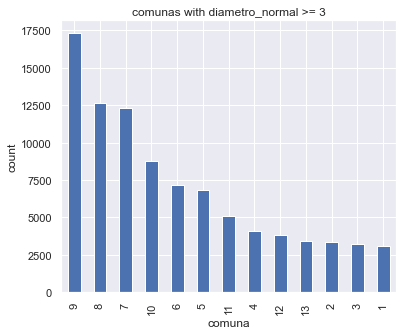

In [191]:
df1=df[df['diametro_normal']>=3]
df1=df1.comuna.value_counts()

df1.plot(kind='bar', title='comunas with diametro_normal >= 3', ylabel='count',
         xlabel='comuna', figsize=(6, 5))

<AxesSubplot:title={'center':'comunas with volumen_m3 <= 0.5'}, xlabel='comuna', ylabel='count'>

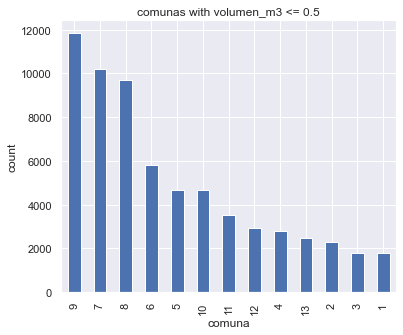

In [192]:
df1=df[df['volumen_m3']<=0.5]
df1=df1.comuna.value_counts()

df1.plot(kind='bar', title='comunas with volumen_m3 <= 0.5', ylabel='count',
         xlabel='comuna', figsize=(6, 5))

<AxesSubplot:title={'center':'comunas with volumen_m3 >= 0.5 and < 1'}, xlabel='comuna', ylabel='count'>

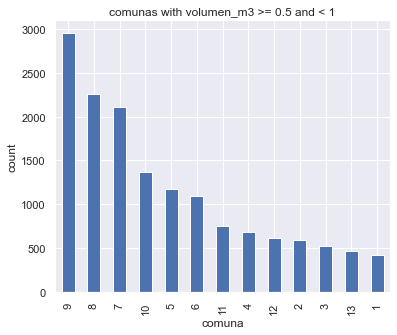

In [193]:
df1=df[(df['volumen_m3']>0.5 )]
df1=df1[(df1['volumen_m3']<1)]
df1=df1.comuna.value_counts()

df1.plot(kind='bar', title='comunas with volumen_m3 >= 0.5 and < 1', ylabel='count',
         xlabel='comuna', figsize=(6, 5))

<AxesSubplot:title={'center':'comunas with volumen_m3 >= 3 and < 5'}, xlabel='comuna', ylabel='count'>

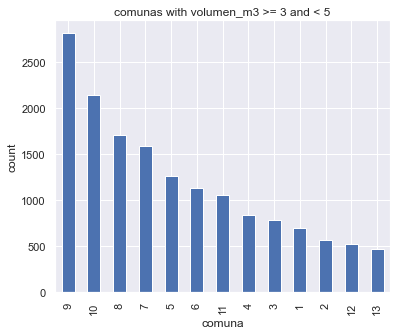

In [194]:
df1=df[(df['volumen_m3']>=1 )]
df1=df1[(df1['volumen_m3']<3)]
df1=df1.comuna.value_counts()

df1.plot(kind='bar', title='comunas with volumen_m3 >= 3 and < 5', ylabel='count',
         xlabel='comuna', figsize=(6, 5))

<AxesSubplot:title={'center':'comunas with volumen_m3 > 5'}, xlabel='comuna', ylabel='count'>

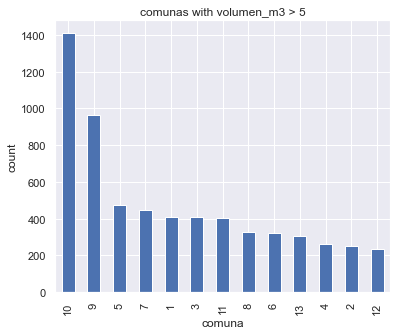

In [195]:
df1=df[df['volumen_m3']>=3]
df1=df1.comuna.value_counts()

df1.plot(kind='bar', title='comunas with volumen_m3 > 5', ylabel='count',
         xlabel='comuna', figsize=(6, 5))

In [196]:
df.comuna.value_counts()

9     18570
7     14336
8     14007
10     9559
6      8350
5      7610
11     5747
4      4582
12     4311
13     3699
2      3676
3      3519
1      3319
Name: comuna, dtype: int64

### Geographical EDA

In [197]:
sns.set_palette('Greens')

In [198]:
data = gpd.read_file('COMUNAS.geojson')
data.head()

,OBJECTID,Id,COMUNAS,Shape_Leng,Shape_Le_1,Shape_Area,geometry
0,1,0,COMUNA 1,4141.096144,4141.270126,3.222838e+05,"MULTIPOLYGON (((-75.26567 4.45682, -75.26564 4..."
1,2,0,COMUNA 1,9933.326365,10226.959500,2.186130e+06,"MULTIPOLYGON (((-75.24996 4.45628, -75.24997 4..."
2,4,0,COMUNA 5,7565.583056,7523.214723,1.811507e+06,"MULTIPOLYGON (((-75.18676 4.43953, -75.18667 4..."
3,5,0,COMUNA 4,9915.426804,9128.942196,2.119334e+06,"MULTIPOLYGON (((-75.20683 4.45311, -75.20684 4..."
4,6,0,COMUNA 3,9788.801255,10202.455196,2.449196e+06,"MULTIPOLYGON (((-75.21391 4.44854, -75.21391 4..."


In [199]:
trees_per_comuna = df.comuna.value_counts()

comuna_values = []
for i in trees_per_comuna.index:
    new_value = f'COMUNA {i}'
    comuna_values.append(new_value)
    
data_for_merge = {
        'COMUNAS':comuna_values,
        'TREES':trees_per_comuna.values
}

trees_df = pd.DataFrame(data_for_merge)
trees_df

,COMUNAS,TREES
0,COMUNA 9,18570
1,COMUNA 7,14336
2,COMUNA 8,14007
3,COMUNA 10,9559
4,COMUNA 6,8350
5,COMUNA 5,7610
6,COMUNA 11,5747
7,COMUNA 4,4582
8,COMUNA 12,4311
9,COMUNA 13,3699


In [200]:
new_data = data.merge(trees_df, how='inner', on='COMUNAS')
new_data.head()

,OBJECTID,Id,COMUNAS,Shape_Leng,Shape_Le_1,Shape_Area,geometry,TREES
0,1,0,COMUNA 1,4141.096144,4141.270126,3.222838e+05,"MULTIPOLYGON (((-75.26567 4.45682, -75.26564 4...",3319
1,2,0,COMUNA 1,9933.326365,10226.959500,2.186130e+06,"MULTIPOLYGON (((-75.24996 4.45628, -75.24997 4...",3319
2,4,0,COMUNA 5,7565.583056,7523.214723,1.811507e+06,"MULTIPOLYGON (((-75.18676 4.43953, -75.18667 4...",7610
3,5,0,COMUNA 4,9915.426804,9128.942196,2.119334e+06,"MULTIPOLYGON (((-75.20683 4.45311, -75.20684 4...",4582
4,6,0,COMUNA 3,9788.801255,10202.455196,2.449196e+06,"MULTIPOLYGON (((-75.21391 4.44854, -75.21391 4...",3519


In [217]:
map_df = new_data
map_df.index = ['COMUNA 1', 'COMUNA 1_', 'COMUNA 5', 'COMUNA 4', 'COMUNA 3', 'COMUNA 2',
       'COMUNA 10', 'COMUNA 8', 'COMUNA 11', 'COMUNA 12', 'COMUNA 6',
       'COMUNA 7', 'COMUNA 9', 'COMUNA 13']
map_df.to_crs(from_epsg(4326), inplace=True)

fig = px.choropleth(map_df, geojson=map_df.geometry, locations=map_df.index, color='TREES', color_continuous_scale="greens")
fig.update_geos(fitbounds='locations', visible=False)

fig.update_layout(
    title = {
        'text':'Trees on Ibague',
        'font_family':'Times New Roman',
        'font_size':22,
        'font_color':"black", 
        'x':0.45,
    },
    
    coloraxis_colorbar={
        'title':'Number of trees',      
    }
         )

fig.show()

In [218]:
def bad_conditions(estado):
    if estado in ['Enfermo', 'Muerto', 'Critico']:
        return 1
    else:
        return 0

In [219]:
df['mal_estado'] = df.estado_sanitario.apply(bad_conditions)
df.groupby('comuna').mal_estado.sum()

comuna
1     277
2     350
3     484
4     229
5     595
6     451
7     615
8     671
9     666
10    557
11    306
12    216
13    118
Name: mal_estado, dtype: int64

In [220]:
trees_mal_estado_per_comuna = df.groupby('comuna').mal_estado.sum()
comuna_values_mal = []
for i in trees_mal_estado_per_comuna.index:
    new_value = f'COMUNA {i}'
    comuna_values_mal.append(new_value)

mal_for_merge = {
    'COMUNAS':comuna_values_mal,
    'MAL_ESTADO':trees_mal_estado_per_comuna.values
}

mal_df = pd.DataFrame(mal_for_merge)

In [221]:
mal_estado_data = data.merge(mal_df, how='inner', on='COMUNAS')
mal_estado_data.head()

,OBJECTID,Id,COMUNAS,Shape_Leng,Shape_Le_1,Shape_Area,geometry,MAL_ESTADO
0,1,0,COMUNA 1,4141.096144,4141.270126,3.222838e+05,"MULTIPOLYGON (((-75.26567 4.45682, -75.26564 4...",277
1,2,0,COMUNA 1,9933.326365,10226.959500,2.186130e+06,"MULTIPOLYGON (((-75.24996 4.45628, -75.24997 4...",277
2,4,0,COMUNA 5,7565.583056,7523.214723,1.811507e+06,"MULTIPOLYGON (((-75.18676 4.43953, -75.18667 4...",595
3,5,0,COMUNA 4,9915.426804,9128.942196,2.119334e+06,"MULTIPOLYGON (((-75.20683 4.45311, -75.20684 4...",229
4,6,0,COMUNA 3,9788.801255,10202.455196,2.449196e+06,"MULTIPOLYGON (((-75.21391 4.44854, -75.21391 4...",484


In [222]:
map_df = mal_estado_data
map_df.index = ['COMUNA 1', 'COMUNA 1_', 'COMUNA 5', 'COMUNA 4', 'COMUNA 3', 'COMUNA 2',
       'COMUNA 10', 'COMUNA 8', 'COMUNA 11', 'COMUNA 12', 'COMUNA 6',
       'COMUNA 7', 'COMUNA 9', 'COMUNA 13']
map_df.to_crs(from_epsg(4326), inplace=True)

fig = px.choropleth(map_df, geojson=map_df.geometry, locations=map_df.index, color='MAL_ESTADO', color_continuous_scale="reds")
fig.update_geos(fitbounds='locations', visible=False)

fig.update_layout(
    title = {
        'text':'Trees in bad conditions on Ibague',
        'font_family':'Times New Roman',
        'font_size':22,
        'font_color':"black", 
        'x':0.45,
    },
    
    coloraxis_colorbar={
        'title':'Number of trees',      
    }
         )

fig.show()

In [223]:
most_common_trees = df.nom_comun.value_counts().head()
x_common = most_common_trees.index
y_common = most_common_trees.values
fig = px.bar(y=y_common, x=x_common, text_auto='.2s',
            title="Most common trees in Ibague",
            labels={'x':'Trees', 'y':'Count'},
            color_discrete_sequence =['mediumseagreen'])
fig.update_layout(title_x=0.5)
fig.show()

In [224]:
c_columns = ['cre', 'crh', 'cra', 'coa', 'ce', 'civ', 'crt', 'crg', 'cap']

conflictos = {
    'cre': 'redes eléctricas',
    'crh':'redes hidráulicas',
    'cra':'redes de alcantarillado',
    'coa':'otros árboles',
    'ce':'estructuras',
    'civ':'infraestructura vial',
    'crt':'redes telefónicas',
    'crg':'redes de gas',
    'cap':'alumbrado público',
}

c_data = df[c_columns].rename(columns=conflictos).replace({'Si':1, 'No':0})
conflict_data = c_data.sum().sort_values(ascending=False).head()
conflict_X = conflict_data.index
conflict_Y = conflict_data.values
fig = px.bar(y=conflict_Y, x=conflict_X, text_auto='.2s',
            title="Most type of conflicts of trees",
            labels={'x':'Conflict', 'y':'Count'},
            color_discrete_sequence =['mediumseagreen'])
fig.update_layout(title_x=0.5)
fig.show()

## Model

In [226]:
df = pd.read_csv('Datos_Ibague.csv', sep=';', encoding='latin1')
df.head()

,OBJECTID,OBJECTID_1,Codigo_Uni,fecha,municipio,comuna,zona,subzona,cod_censista,num_arbol,familia,nom_cientifico,nom_comun,procedencia,UICN,habito_creciemiento,emplazamiento,altura_fuste,altura_total,diametro_copa,diametro_normal,volumen_m3,inc,rd,dm,bbs,abs,estado_fisico,pi,ph,pa,pd,pe,pp,po,estado_sanitario,densidad_follaje,valor_estetico,cre,crh,cra,coa,ce,civ,crt,crg,cap,r_vol,r_cr,r_ce,fotografia,fase,GlobalID,X,Y,Barrio
0,98717,56585,67352 - F3,16/05/2017,Ibague,7,4,4,Cuadrilla_12,67352,Myrtaceae,Syzygium_malaccense,Pera_de_malaca,Exotica,LC,Arbol,Zona_blanda,3,"5,2",2,"18,3","0,523170648",0,0,0,0,0,Malo,20,0,0,80,0,0,0,Muerto,Ralo,Inaceptable,No,No,No,No,No,No,No,No,No,0,0,0,C:\Users\juan-arias.CORTOLI1\Documents\ArcGIS\...,F3,{DF618195-9BA3-42B8-B900-153874CA5FD7},"883744,684","984472,5618",Otro
1,99083,61808,65768 - F3,16/05/2017,Ibague,7,4,4,Cuadrilla_10,65768,Fabaceae,Pithecellobium_dulce,Payande,Nativa,LC,Arbol,Zona_blanda,"0,5","4,9","2,5","17,7","0,476824194",0,0,20,40,20,Regular,0,0,0,20,0,0,0,Sano,Denso,Deseable,No,No,No,Si,No,No,No,No,No,0,0,0,C:\Users\juan-arias.CORTOLI1\Documents\ArcGIS\...,F3,{F03C72BE-7978-4F7C-B2D3-A6525632AE19},"883742,6131","984515,2839",Otro
2,98669,66706,65769 - F3,16/05/2017,Ibague,7,4,4,Cuadrilla_10,65769,Combretaceae,Terminalia_catappa,Almendro,Exotica,NE,Arbol,Zona_blanda,"3,5","5,5",5,27,"0,8164233",0,20,0,0,0,Bueno,0,0,0,20,0,0,0,Sano,Denso,Deseable,No,No,No,Si,No,Si,No,No,No,20,20,0,C:\Users\juan-arias.CORTOLI1\Documents\ArcGIS\...,F3,{0ADD2CC1-1E82-4EC2-B98D-7DD8016B71D3},"883741,3773","984466,8292",Otro
3,99327,59629,65767 - F3,16/05/2017,Ibague,7,4,4,Cuadrilla_10,65767,Fabaceae,Pithecellobium_dulce,Payande,Nativa,LC,Arbol,Zona_blanda,"0,6","3,8",3,"11,6","0,242343024",20,0,20,0,20,Regular,20,0,0,0,0,0,0,Sano,Denso,Deseable,No,No,No,Si,No,No,No,No,No,0,0,0,C:\Users\juan-arias.CORTOLI1\Documents\ArcGIS\...,F3,{03AAD258-1A06-4A17-8EB0-A7E5AA323338},"883741,158","984540,5588",Otro
4,98884,64850,66071 - F3,16/05/2017,Ibague,7,4,4,Cuadrilla_11,66071,Myrtaceae,Psidium_guajava,Guayabo,Nativa,NE,Arbol,Zona_blanda,"3,6","7,5",5,21,"0,8659035",20,0,0,0,0,Bueno,0,0,0,0,0,0,0,Sano,Denso,Deseable,No,No,No,Si,No,No,No,No,No,0,0,0,C:\Users\juan-arias.CORTOLI1\Documents\ArcGIS\...,F3,{A942F3CE-2719-416E-9F46-F3A03E97BD97},"883741,0111","984493,2908",Otro


### Data cleaning for the model

In [227]:
df['fecha'] = pd.to_datetime(df.fecha)
def sort_unique(column_name):
    return df[column_name].sort_values().unique()
sci_names = list(sort_unique('nom_cientifico'))
def splitting_sci_names(name):
    if '?�' in name:
        return str(name).split('?�')
    return str(name).split('_')

def fixing_sci_names(name):
    if '?�' in name:
        return str(name).replace('?�', '_')
    return name

df['nom_cientifico'] = df.nom_cientifico.apply(fixing_sci_names)
df['familia'] = df.familia.str.strip()

dicc_UICN = {
    'CR':'En_peligro_critico',
    'EN':'En_peligro_vulnerable',
    'EW':'Extinto_en_estado_silvestre',
    'LC':'Preocupacion_menor',
    'NE':'No_evaluado',
    'NT':'Casi_amenazado',
    'VU':'Vulnerable'
}

df['UICN'] = df['UICN'].replace(to_replace=dicc_UICN)
df.rename(columns={'habito_creciemiento':'habito_crecimiento'}, inplace=True)
df.rename(columns={'estado_sanitario ':'estado_sanitario'}, inplace=True)
var = ['nom_cientifico','familia','nom_comun','procedencia','UICN','habito_crecimiento','emplazamiento','estado_fisico','densidad_follaje','valor_estetico','comuna','fase', 'Barrio']
df[var] = df[var].astype('category')
dicc_c = {
    'No':'0',
    'Si':'1'
}
var_c=['cre', 'crh', 'cra', 'coa', 'ce', 'civ', 'crt', 'crg', 'cap']
df[var_c] = df[var_c].replace(to_replace=dicc_c)
df[var_c] = df[var_c].astype('int64')

df.rename(columns={'altura_fuste ':'altura_fuste'}, inplace=True)
float_columns = ['altura_fuste', 'altura_total', 'diametro_copa', 'diametro_normal', 'volumen_m3']
for column in float_columns:
    df[column] = df[column].apply(lambda x: str(x).replace(',', '.'))
dypsis_median = df[(df.nom_cientifico == 'Dypsis_lutescens') & (df.comuna == 7) & (df.diametro_copa != '<NULL>')].diametro_copa.median()
df.at[857, 'diametro_copa'] = dypsis_median
cassia_mean = round((df[(df.nom_cientifico == 'Cassia_fistula') & (df.comuna == 7) & (df.diametro_copa != '<NULL>')].diametro_copa).astype('float').mean(), 1)
df.at[1720, 'diametro_copa'] = cassia_mean
syzygium_mean = round((df[(df.nom_cientifico == 'Syzygium_malaccense') & (df.comuna == 5) & (df.diametro_copa != '<NULL>')].diametro_copa).astype('float').mean(), 1)
df.at[50485, 'diametro_copa'] = syzygium_mean
for column in float_columns:
    df[column] = df[column].astype('float')

In [228]:
df=df[df['zona']!='--']
df=df[df['subzona']!='--']
df[df['fecha']!='1899-12-30']
df=df.drop(['fecha','cod_censista','municipio','nom_cientifico','nom_comun','OBJECTID','OBJECTID_1','Codigo_Uni','num_arbol', 'fotografia', 'GlobalID', 'X', 'Y', 'Barrio', 'zona', 'subzona', 'volumen_m3','diametro_copa','altura_total','inc','abs','dm','valor_estetico', 'fase', 'UICN', 'procedencia'],axis=1)

In [229]:
var_bool= ['rd', 'bbs', 'pi', 'ph', 'pa', 'pd', 'pe', 'pp', 'po', 'cre', 'crh', 'cra', 'coa','ce', 'civ', 'crt', 'crg', 'cap', 'r_vol', 'r_cr', 'r_ce']
df[var_bool]=np.where(df[var_bool]==0, 0, 1)
df

,comuna,familia,habito_crecimiento,emplazamiento,altura_fuste,diametro_normal,rd,bbs,estado_fisico,pi,ph,pa,pd,pe,pp,po,estado_sanitario,densidad_follaje,cre,crh,cra,coa,ce,civ,crt,crg,cap,r_vol,r_cr,r_ce
0,7,Myrtaceae,Arbol,Zona_blanda,3.0,18.3,0,0,Malo,1,0,0,1,0,0,0,Muerto,Ralo,0,0,0,0,0,0,0,0,0,0,0,0
1,7,Fabaceae,Arbol,Zona_blanda,0.5,17.7,0,1,Regular,0,0,0,1,0,0,0,Sano,Denso,0,0,0,1,0,0,0,0,0,0,0,0
2,7,Combretaceae,Arbol,Zona_blanda,3.5,27.0,1,0,Bueno,0,0,0,1,0,0,0,Sano,Denso,0,0,0,1,0,1,0,0,0,1,1,0
3,7,Fabaceae,Arbol,Zona_blanda,0.6,11.6,0,0,Regular,1,0,0,0,0,0,0,Sano,Denso,0,0,0,1,0,0,0,0,0,0,0,0
4,7,Myrtaceae,Arbol,Zona_blanda,3.6,21.0,0,0,Bueno,0,0,0,0,0,0,0,Sano,Denso,0,0,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101280,1,Myrtaceae,Arbol,Zona_blanda,1.6,5.1,0,0,Regular,1,1,1,1,0,0,0,Enfermo,Ralo,0,0,0,1,0,0,0,0,0,0,0,0
101281,1,Arecaceae,Palma,Zona_blanda,6.0,13.2,1,0,Bueno,0,0,0,0,1,0,1,Sano,Denso,0,0,0,0,1,0,1,0,0,0,1,1
101282,1,Myrtaceae,Arbol,Zona_blanda,1.4,19.0,0,0,Regular,1,0,0,1,0,0,0,Sano,Denso,0,0,0,1,0,0,0,0,0,1,1,0
101283,1,Malvaceae,Arbusto,Zona_blanda,2.0,5.0,0,1,Regular,1,0,0,0,0,0,0,Sano,Ralo,0,0,0,0,0,0,0,0,0,0,0,0


### Dataset division

In [230]:
df['estado_sanitario'].value_counts()

Sano       95736
Enfermo     3885
Muerto      1107
Critico      543
Name: estado_sanitario, dtype: int64

In [231]:
df_x=df.drop('estado_sanitario', axis=1)
df_y = df['estado_sanitario']
final_df_x = pd.get_dummies(df_x,columns=df_x.columns[df_x.dtypes=='category'])#, drop_first=True)
final_df_x

,altura_fuste,diametro_normal,rd,bbs,pi,ph,pa,pd,pe,pp,po,cre,crh,cra,coa,ce,civ,crt,crg,cap,r_vol,r_cr,r_ce,comuna_1,comuna_2,comuna_3,comuna_4,comuna_5,comuna_6,comuna_7,comuna_8,comuna_9,comuna_10,comuna_11,comuna_12,comuna_13,familia_Acanthaceae,familia_Adoxaceae,familia_Amaranthaceae,familia_Anacardiaceae,familia_Annonaceae,familia_Apocynaceae,familia_Araliaceae,familia_Araucariaceae,familia_Arecaceae,familia_Asparagaceae,familia_Asteraceae,familia_Basellaceae,familia_Bignoniaceae,familia_Bixaceae,familia_Boraginaceae,familia_Burseraceae,familia_Cactaceae,familia_Calophyllaceae,familia_Cannabaceae,familia_Capparidaceae,familia_Caricaceae,familia_Casuarinaceae,familia_Chrysobalanaceae,familia_Clusiaceae,familia_Combretaceae,familia_Compositae,familia_Cupressaceae,familia_Cycadaceae,familia_Erythroxylaceae,familia_Estrelitziaceae,familia_Euphorbiaceae,familia_Fabaceae,familia_Hernandiaceae,familia_Hipericaceae,familia_Juglandaceae,familia_Lacistemataceae,familia_Lamiaceae,familia_Lauraceae,familia_Lecythidaceae,familia_Leguminosae,familia_Lythraceae,familia_Magnoliaceae,familia_Malpighiaceae,familia_Malvaceae,familia_Melastomataceae,familia_Meliaceae,familia_Moraceae,familia_Moringaceae,familia_Muntingiaceae,familia_Myrtaceae,familia_Nyctaginaceae,familia_Ocnaceae,familia_Oleaceae,familia_Oxalidaceae,familia_Pandanaceae,familia_Passifloraceae,familia_Phyllanthaceae,familia_Pinaceae,familia_Piperaceae,familia_Plumbaginaceae,familia_Poaceae,familia_Podocarpaceae,familia_Poligonaceae,familia_Primulaceae,familia_Proteaceae,familia_Ramnaceae,familia_Rosaceae,familia_Rubiaceae,familia_Rutaceae,familia_Salicaceae,familia_Sapindaceae,familia_Sapotaceae,familia_Scrophulariaceae,familia_Simarubaceae,familia_Solanaceae,familia_Taxodiaceae,familia_Thymelaeaceae,familia_Urticaceae,familia_Verbenaceae,familia_Zygophyllaceae,habito_crecimiento_Arbol,habito_crecimiento_Arbusto,habito_crecimiento_Bambu,habito_crecimiento_Palma,emplazamiento_Alcorque,emplazamiento_Anden,emplazamiento_Antejardin,emplazamiento_Glorieta,emplazamiento_Parque,emplazamiento_Separador_vial,emplazamiento_Zona_blanda,estado_fisico_Bueno,estado_fisico_Malo,estado_fisico_Regular,densidad_follaje_Denso,densidad_follaje_Medio,densidad_follaje_Ralo
0,3.0,18.3,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1
1,0.5,17.7,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0
2,3.5,27.0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0
3,0.6,11.6,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0
4,3.6,21.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

In [232]:
train_X, val_X, train_y, val_y = train_test_split(final_df_x, df_y, test_size=0.2,random_state=7) 
print(train_X.shape) 
print(val_X.shape)  

(81016, 133)
(20255, 133)


In [233]:
train_y.value_counts()

Sano       76624
Enfermo     3093
Muerto       870
Critico      429
Name: estado_sanitario, dtype: int64

In [234]:
sm=SMOTE()
train_X, train_y=sm.fit_resample(train_X, train_y)

In [235]:
train_y.value_counts()

Muerto     76624
Sano       76624
Enfermo    76624
Critico    76624
Name: estado_sanitario, dtype: int64

In [236]:
forest = RandomForestClassifier(random_state=7, n_estimators=100)

### Random Forest

In [237]:
forest.fit(train_X, train_y)
y_pred=forest.predict(val_X)
print('--------------The Accuracy of the model----------------------------')
print('The accuracy of the Random Forest model is',round(accuracy_score(val_y, y_pred)*100,2))
print(accuracy_score(val_y, y_pred))

--------------The Accuracy of the model----------------------------
The accuracy of the Random Forest model is 95.26
0.9525549247099482


In [238]:
kfold = KFold(n_splits=10, random_state=None)
result_rf=cross_val_score(forest,final_df_x,df_y,cv=10,scoring='accuracy')
print('The cross validated score for Random Forest model is:',round(result_rf.mean()*100,2))

The cross validated score for Random Forest model is: 95.06


In [239]:
print(classification_report(val_y, y_pred))

              precision    recall  f1-score   support

     Critico       0.40      0.12      0.19       114
     Enfermo       0.47      0.54      0.50       792
      Muerto       0.71      0.86      0.78       237
        Sano       0.98      0.98      0.98     19112

    accuracy                           0.95     20255
   macro avg       0.64      0.63      0.61     20255
weighted avg       0.95      0.95      0.95     20255



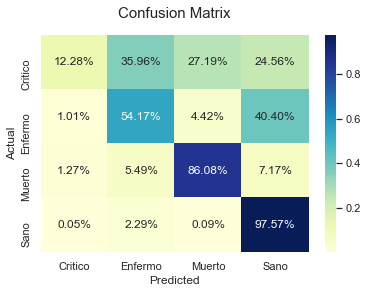

In [240]:
target_names=[ "Critico","Enfermo","Muerto","Sano"]
cm = confusion_matrix(val_y, y_pred)
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
sns.heatmap(cmn, annot=True, fmt='.2%', cmap="YlGnBu",xticklabels=target_names, yticklabels=target_names)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix', y=1.05, size=15);

### Save the Model

In [241]:
import joblib
# save the model to disk
filename = 'finalized_model_compress.pkl'
joblib.dump(forest, filename, compress=3)
 
# load the model from disk
loaded_model = joblib.load(filename)
result = loaded_model.score(val_X, val_y)
print(result)

0.9525549247099482
